In [1]:
setwd('~/Downloads/proj/')

library(data.table)
library(edgeR)
library(EDASeq)
library(RUVSeq)
library(affycoretools)
library(ggplot2)
library(DESeq2)
library(pheatmap)
require(dplyr)
require(stringr)

# project directories, and libraries loaded and saving total number of patients

MM_cell_line = data.frame(fread("HMCL66_HTSeq_GENE_Counts_v2.txt"))
MM_patients = data.frame(fread("MMRF_CoMMpass_IA13a_E74GTF_HtSeq_Gene_Counts.txt"))

num_pat_tot = length(MM_patients[2,])
num_cell_line_tot = length(MM_cell_line[2,])

# checking total number of patients and cell lines and output head

head(MM_cell_line)
head(MM_patients)
print(num_pat_tot)
print(num_cell_line_tot)

Loading required package: limma
Loading required package: Biobase
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following object is masked from ‘package:limma’:

    plotMA

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colMeans,
    colnames, colSums, dirname, do.call, duplicated, eval, evalq,
    Filter, Find, get, grep, grepl, intersect, is.unsorted, lapply,
    lengths, Map, mapply, match, mget, order, paste, pmax, pmax.int,
    pmin, pmin.int, Position, rank, rbind, Reduce, rowMeans, rownames,
    rowSums, sapply, setdiff, sort, tab

Sample,GENE_NAME,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,⋯,RPMI8226_ATCC_p7,SKMM1_p6,SKMM2_DSMZ_p17,U266_ATCC_p8,UTMC2_p6,VP6_DJ_p5,XG1_p5,XG2_p5,XG6_p5,XG7_p6
<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,TSPAN6,2,0,100,2,0,0,2,88,⋯,2,0,0,0,0,0,0,0,2,114
ENSG00000000005,TNMD,1,0,0,0,1,0,0,0,⋯,0,1,0,0,0,0,0,0,0,0
ENSG00000000419,DPM1,3949,4134,4795,8278,2262,2587,3607,2450,⋯,2694,1247,3263,3044,3108,4538,7336,4430,9279,13828
ENSG00000000457,SCYL3,1597,1513,2412,1988,1530,926,1415,573,⋯,665,994,497,1611,1603,1375,1426,893,1540,1660
ENSG00000000460,C1orf112,3072,1488,2193,4091,3208,1170,3614,1618,⋯,1472,1517,1346,2068,3128,1850,2522,2320,793,689
ENSG00000000938,FGR,0,22,701,5,2,4,89,4,⋯,0,125,777,50,1890,2315,1514,5,3776,847


GENE_ID,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2531_2_PB,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2089_2_BM,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,17,999,85,9,801,20,12,16,4,⋯,2,186,102,347,128,17,11,3,18,6
ENSG00000000005,1,0,0,2,3,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
ENSG00000000419,1495,3271,2303,1234,1896,4400,2013,1745,1698,⋯,2459,1269,337,3347,1049,2545,1625,1253,1905,683
ENSG00000000457,231,809,203,1208,425,2793,710,922,853,⋯,734,771,327,392,90,406,857,548,808,393
ENSG00000000460,87,319,31,183,85,929,174,292,837,⋯,267,104,114,126,17,67,196,141,199,55
ENSG00000000938,318,105,119,190,2064,2952,12,351,498,⋯,46,14,303,2007,58,77,1037,11,174,22


[1] 893
[1] 68


In [84]:
CCLE_cell_line = data.frame(fread("CCLE_RNAseq_genes_counts_20180929.gct"))
head(CCLE_cell_line)

Name,Description,X22RV1_PROSTATE,X2313287_STOMACH,X253JBV_URINARY_TRACT,X253J_URINARY_TRACT,X42MGBA_CENTRAL_NERVOUS_SYSTEM,X5637_URINARY_TRACT,X59M_OVARY,X639V_URINARY_TRACT,⋯,WSUDLCL2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,YAPC_PANCREAS,YD10B_UPPER_AERODIGESTIVE_TRACT,YD15_SALIVARY_GLAND,YD38_UPPER_AERODIGESTIVE_TRACT,YD8_UPPER_AERODIGESTIVE_TRACT,YH13_CENTRAL_NERVOUS_SYSTEM,YKG1_CENTRAL_NERVOUS_SYSTEM,ZR751_BREAST,ZR7530_BREAST
<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000223972.4,DDX11L1,12,8,8,6,2,1,4,3,⋯,18,14,40,39,25,14,11,5,13,6
ENSG00000227232.4,WASH7P,1340,821,678,677,884,868,611,692,⋯,562,328,663,270,233,558,309,811,500,945
ENSG00000243485.2,MIR1302-11,4,1,3,3,2,6,3,4,⋯,11,7,24,24,20,6,3,1,6,5
ENSG00000237613.2,FAM138A,6,3,2,4,1,4,3,1,⋯,14,16,31,19,24,8,7,0,10,4
ENSG00000268020.2,OR4G4P,0,2,3,1,1,0,1,2,⋯,8,3,15,7,5,3,5,4,3,2
ENSG00000240361.1,OR4G11P,4,5,3,5,1,5,4,0,⋯,8,7,25,16,18,7,6,0,10,2


In [85]:
gid = CCLE_cell_line$Name
head(gid)

[1] "ENSG00000223972.4" "ENSG00000227232.4" "ENSG00000243485.2"
[4] "ENSG00000237613.2" "ENSG00000268020.2" "ENSG00000240361.1"

In [87]:
gid2 = substr(gid, 1, 15)
head(gid2)

[1] "ENSG00000223972" "ENSG00000227232" "ENSG00000243485" "ENSG00000237613"
[5] "ENSG00000268020" "ENSG00000240361"

In [89]:
rownames(CCLE_cell_line) = gid2
head(CCLE_cell_line)

,Name,Description,X22RV1_PROSTATE,X2313287_STOMACH,X253JBV_URINARY_TRACT,X253J_URINARY_TRACT,X42MGBA_CENTRAL_NERVOUS_SYSTEM,X5637_URINARY_TRACT,X59M_OVARY,X639V_URINARY_TRACT,⋯,WSUDLCL2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,YAPC_PANCREAS,YD10B_UPPER_AERODIGESTIVE_TRACT,YD15_SALIVARY_GLAND,YD38_UPPER_AERODIGESTIVE_TRACT,YD8_UPPER_AERODIGESTIVE_TRACT,YH13_CENTRAL_NERVOUS_SYSTEM,YKG1_CENTRAL_NERVOUS_SYSTEM,ZR751_BREAST,ZR7530_BREAST
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000223972,ENSG00000223972.4,DDX11L1,12,8,8,6,2,1,4,3,⋯,18,14,40,39,25,14,11,5,13,6
ENSG00000227232,ENSG00000227232.4,WASH7P,1340,821,678,677,884,868,611,692,⋯,562,328,663,270,233,558,309,811,500,945
ENSG00000243485,ENSG00000243485.2,MIR1302-11,4,1,3,3,2,6,3,4,⋯,11,7,24,24,20,6,3,1,6,5
ENSG00000237613,ENSG00000237613.2,FAM138A,6,3,2,4,1,4,3,1,⋯,14,16,31,19,24,8,7,0,10,4
ENSG00000268020,ENSG00000268020.2,OR4G4P,0,2,3,1,1,0,1,2,⋯,8,3,15,7,5,3,5,4,3,2
ENSG00000240361,ENSG00000240361.1,OR4G11P,4,5,3,5,1,5,4,0,⋯,8,7,25,16,18,7,6,0,10,2


In [90]:
CCLE_cell_line = CCLE_cell_line[-1]
CCLE_cell_line = CCLE_cell_line[-1]
head(CCLE_cell_line)

,X22RV1_PROSTATE,X2313287_STOMACH,X253JBV_URINARY_TRACT,X253J_URINARY_TRACT,X42MGBA_CENTRAL_NERVOUS_SYSTEM,X5637_URINARY_TRACT,X59M_OVARY,X639V_URINARY_TRACT,X647V_URINARY_TRACT,X697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,⋯,WSUDLCL2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,YAPC_PANCREAS,YD10B_UPPER_AERODIGESTIVE_TRACT,YD15_SALIVARY_GLAND,YD38_UPPER_AERODIGESTIVE_TRACT,YD8_UPPER_AERODIGESTIVE_TRACT,YH13_CENTRAL_NERVOUS_SYSTEM,YKG1_CENTRAL_NERVOUS_SYSTEM,ZR751_BREAST,ZR7530_BREAST
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000223972,12,8,8,6,2,1,4,3,4,7,⋯,18,14,40,39,25,14,11,5,13,6
ENSG00000227232,1340,821,678,677,884,868,611,692,639,728,⋯,562,328,663,270,233,558,309,811,500,945
ENSG00000243485,4,1,3,3,2,6,3,4,4,2,⋯,11,7,24,24,20,6,3,1,6,5
ENSG00000237613,6,3,2,4,1,4,3,1,2,3,⋯,14,16,31,19,24,8,7,0,10,4
ENSG00000268020,0,2,3,1,1,0,1,2,0,2,⋯,8,3,15,7,5,3,5,4,3,2
ENSG00000240361,4,5,3,5,1,5,4,0,3,3,⋯,8,7,25,16,18,7,6,0,10,2


In [91]:
CCLE_cell_line_meta = data.frame(fread("Cell_lines_annotations_20181226.txt"))
head(CCLE_cell_line_meta)

CCLE_ID,depMapID,Name,Pathology,Site_Primary,Site_Subtype1,Site_Subtype2,Site_Subtype3,Histology,Hist_Subtype1,⋯,Growth.Medium,Supplements,Freezing.Medium,Doubling.Time.from.Vendor,Doubling.Time.Calculated.hrs,type,type_refined,PATHOLOGIST_ANNOTATION,mutRate,tcga_code
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>
DMS53_LUNG,ACH-000698,DMS 53,primary,lung,NS,NS,NS,carcinoma,small_cell_carcinoma,⋯,Waymouth's +10%FBS,NA,5%DMSO,,450.0,lung_small_cell,lung_small_cell,Lung:SCLC,157.24164,SCLC
SW1116_LARGE_INTESTINE,ACH-000489,SW1116,primary,large_intestine,colon,NS,NS,carcinoma,adenocarcinoma,⋯,L15+10%FBS,NA,5%DMSO,,123.2,colorectal,colorectal,Colorectal:Carcinoma,94.37319,COAD/READ
NCIH1694_LUNG,ACH-000431,NCI-H1694,metastasis,lung,NS,NS,NS,carcinoma,small_cell_carcinoma,⋯,DMEM:F12 (1:1) + 5% FBS,".005 mg/ml insulin, .01 mg/ml transferrin, 30nM sodium selenite, 10 nM hydrocortisone, 10 nM beta estradiol, 10 mM HEPES, 2 mM L-glutamine",5% DMSO,,81.2,lung_small_cell,lung_small_cell,Lung:SCLC,109.53499,SCLC
P3HR1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,ACH-000707,P3HR-1,metastasis,haematopoietic_and_lymphoid_tissue,NS,NS,NS,lymphoid_neoplasm,Burkitt_lymphoma,⋯,,,,,NA,lymphoma_Burkitt,lymphoma_Burkitt,Lymphoma:NH_B_cell,166.45641,DLBC
HUT78_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,ACH-000509,HuT 78,primary,haematopoietic_and_lymphoid_tissue,skin,NS,NS,lymphoid_neoplasm,mycosis_fungoides-Sezary_syndrome,⋯,,,,,NA,lymphoma_other,T-cell_lymphoma_other,Lymphoma:NH_T_cell,118.21757,NA
UMUC3_URINARY_TRACT,ACH-000522,UM-UC-3,primary,urinary_tract,bladder,NS,NS,carcinoma,transitional_cell_carcinoma,⋯,EMEM +10%FBS,NA,5%DMSO,,386.7,urinary_tract,urinary_tract,Bladder:Carcinoma,124.70796,BLCA


In [99]:
CCLE_bool = (CCLE_cell_line_meta$type == 'multiple_myeloma')
length(CCLE_bool)


[1] 1461

In [102]:
CCLE_cell_line_meta_2 = CCLE_cell_line_meta[(CCLE_cell_line_meta$type == 'multiple_myeloma'),]
head(CCLE_cell_line_meta_2)
length(CCLE_cell_line_meta_2)

,CCLE_ID,depMapID,Name,Pathology,Site_Primary,Site_Subtype1,Site_Subtype2,Site_Subtype3,Histology,Hist_Subtype1,⋯,Growth.Medium,Supplements,Freezing.Medium,Doubling.Time.from.Vendor,Doubling.Time.Calculated.hrs,type,type_refined,PATHOLOGIST_ANNOTATION,mutRate,tcga_code
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>
8,HUNS1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,ACH-000829,HuNS1,primary,haematopoietic_and_lymphoid_tissue,NS,NS,NS,lymphoid_neoplasm,plasma_cell_myeloma,⋯,,,,,NA,multiple_myeloma,multiple_myeloma,Lymphoma:Multiple_Myeloma,187.9139,MM
131,PCM6_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,ACH-001162,PCM6,primary,haematopoietic_and_lymphoid_tissue,NS,NS,NS,lymphoid_neoplasm,plasma_cell_myeloma,⋯,McCoy's 5A +20% FBS,NA,5%DMSO,,NA,multiple_myeloma,multiple_myeloma,Lymphoma:Multiple_Myeloma,NA,MM
171,KMS18_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,ACH-000658,KMS-18,primary,haematopoietic_and_lymphoid_tissue,NS,NS,NS,lymphoid_neoplasm,plasma_cell_myeloma,⋯,,,,,NA,multiple_myeloma,multiple_myeloma,NA,NA,MM
226,KMS21BM_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,ACH-000598,KMS-21BM,primary,haematopoietic_and_lymphoid_tissue,NS,NS,NS,lymphoid_neoplasm,plasma_cell_myeloma,⋯,RPMI 1640 medium with 10% fetal bovine serum.,NA,,NA,NA,multiple_myeloma,multiple_myeloma,Lymphoma:Multiple_Myeloma,160.2806,MM
227,KMS26_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,ACH-000588,KMS-26,primary,haematopoietic_and_lymphoid_tissue,NS,NS,NS,lymphoid_neoplasm,plasma_cell_myeloma,⋯,RPMI1640+10%FBS,NA,5%DMSO,,33.2,multiple_myeloma,multiple_myeloma,Lymphoma:Multiple_Myeloma,149.7017,MM
228,KMS27_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,ACH-000576,KMS-27,primary,haematopoietic_and_lymphoid_tissue,NS,NS,NS,lymphoid_neoplasm,plasma_cell_myeloma,⋯,RPMI1640+10%FBS,NA,5%DMSO,,73.2,multiple_myeloma,multiple_myeloma,Lymphoma:Multiple_Myeloma,169.0553,MM


[1] 33

In [103]:
sum(colnames(CCLE_cell_line) %in% CCLE_cell_line_meta_2$CCLE_ID)

[1] 27

In [104]:
CCLE_bool2 = colnames(CCLE_cell_line) %in% CCLE_cell_line_meta_2$CCLE_ID
CCLE_cell_line_2 = CCLE_cell_line[,CCLE_bool2]
head(CCLE_cell_line_2)

,AMO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,EJM_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,HUNS1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,JJN3_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KARPAS620_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KE97_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KHM1B_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMS11_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMS12BM_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,⋯,L363_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,LP1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MM1S_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MOLP2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MOLP8_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NCIH929_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,OPM2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,RPMI8226_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,SKMM2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,U266B1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000223972,16,5,6,3,14,5,3,7,4,40,⋯,13,6,22,14,8,4,3,12,8,18
ENSG00000227232,877,916,809,1040,839,632,631,1466,1233,1105,⋯,2547,1633,1893,922,1269,955,1461,1088,1142,394
ENSG00000243485,5,1,6,1,11,4,4,2,4,2,⋯,3,0,3,3,9,4,2,4,2,4
ENSG00000237613,3,3,3,1,15,1,3,0,2,4,⋯,1,4,3,2,5,2,2,2,4,4
ENSG00000268020,1,2,3,0,5,1,0,0,1,0,⋯,2,1,1,2,1,1,2,1,0,3
ENSG00000240361,2,1,1,1,4,0,1,2,1,4,⋯,1,2,7,3,5,2,0,3,3,8


In [107]:
CCLE_cell_line_2$name2 = rownames(CCLE_cell_line_2)
head(CCLE_cell_line_2)

,AMO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,EJM_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,HUNS1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,JJN3_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KARPAS620_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KE97_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KHM1B_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMS11_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMS12BM_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,⋯,LP1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MM1S_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MOLP2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MOLP8_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NCIH929_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,OPM2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,RPMI8226_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,SKMM2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,U266B1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,name2
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
ENSG00000223972,16,5,6,3,14,5,3,7,4,40,⋯,6,22,14,8,4,3,12,8,18,ENSG00000223972
ENSG00000227232,877,916,809,1040,839,632,631,1466,1233,1105,⋯,1633,1893,922,1269,955,1461,1088,1142,394,ENSG00000227232
ENSG00000243485,5,1,6,1,11,4,4,2,4,2,⋯,0,3,3,9,4,2,4,2,4,ENSG00000243485
ENSG00000237613,3,3,3,1,15,1,3,0,2,4,⋯,4,3,2,5,2,2,2,4,4,ENSG00000237613
ENSG00000268020,1,2,3,0,5,1,0,0,1,0,⋯,1,1,2,1,1,2,1,0,3,ENSG00000268020
ENSG00000240361,2,1,1,1,4,0,1,2,1,4,⋯,2,7,3,5,2,0,3,3,8,ENSG00000240361


In [109]:
#CLE_cell_line_2$name2 = NULL
#ead(CCLE_cell_line_2)

MM_patients$name2 = rownames(MM_patients)
head(MM_patients)

ensembl_intersect = intersect(CCLE_cell_line_2$name2, MM_patients$name2)
head(ensembl_intersect)

,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2341_1_BM,MMRF_2501_1_BM,MMRF_1383_1_BM,⋯,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM,name2
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
ENSG00000000003,17,999,85,9,801,12,16,43,594,693,⋯,49,2,186,102,128,17,3,18,6,ENSG00000000003
ENSG00000000419,1495,3271,2303,1234,1896,2013,1745,2403,1847,973,⋯,2537,2459,1269,337,1049,2545,1253,1905,683,ENSG00000000419
ENSG00000000457,231,809,203,1208,425,710,922,1203,1160,587,⋯,220,734,771,327,90,406,548,808,393,ENSG00000000457
ENSG00000000460,87,319,31,183,85,174,292,478,218,107,⋯,50,267,104,114,17,67,141,199,55,ENSG00000000460
ENSG00000000938,318,105,119,190,2064,12,351,555,37,21,⋯,46,46,14,303,58,77,11,174,22,ENSG00000000938
ENSG00000000971,347,1093,374,140,287,16,238,35,61,15,⋯,27,13,5,28,30,18,1680,56,10,ENSG00000000971


[1] "ENSG00000227232" "ENSG00000238009" "ENSG00000237683" "ENSG00000241860"
[5] "ENSG00000228463" "ENSG00000237094"

In [2]:
# finding genes in common and creating character vector of Ensembl Gene IDs

ensembl_intersect = intersect(MM_cell_line$Sample, MM_patients$GENE_ID)

# assigning rownames as ensembl gene IDs so as to be able to parse by ensembl Gene IDs

rownames(MM_cell_line) = MM_cell_line$Sample
rownames(MM_patients) = MM_patients$GENE_ID

# removing gene ID and gene name columns 
# and saving them in a separate place 
# note only those available in MM_cell_line
# also filtering out genes in common
# and fusing them into a single dataframe
# and filtering for only newly diagnosed patients

ensembl_ids = MM_cell_line[,1]
MM_cell_line = MM_cell_line[, -1]
gene_names = MM_cell_line[,1]
gene_info = cbind(ensembl_ids, gene_names)

MM_cell_line = MM_cell_line[,-1]
MM_cell_line = MM_cell_line[ensembl_intersect, ]
MM_patients = MM_patients[ensembl_intersect, -1]

MM_patient_ids = data.frame(colnames(MM_patients))
MM_patients_new = filter(MM_patient_ids, str_extract(MM_patient_ids[,1], "_[0-9]_") == "_1_")
keepc = colnames(MM_patients) %in% MM_patients_new[,1]
MM_patients = MM_patients[,keepc]

MM_combined = cbind(MM_cell_line, MM_patients)

# checking output head to confirm removal

head(MM_cell_line)
head(MM_patients)
head(MM_combined)
head(gene_info)

# saving number of newly diagnosed patients and printing out percentage

num_new_pat = length(MM_patients[2,])
print(num_new_pat)
print((num_new_pat/num_pat_tot)*100)

,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,RPMI8226_ATCC_p7,SKMM1_p6,SKMM2_DSMZ_p17,U266_ATCC_p8,UTMC2_p6,VP6_DJ_p5,XG1_p5,XG2_p5,XG6_p5,XG7_p6
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,2,0,100,2,0,0,2,88,4,0,⋯,2,0,0,0,0,0,0,0,2,114
ENSG00000000005,1,0,0,0,1,0,0,0,0,0,⋯,0,1,0,0,0,0,0,0,0,0
ENSG00000000419,3949,4134,4795,8278,2262,2587,3607,2450,1388,3308,⋯,2694,1247,3263,3044,3108,4538,7336,4430,9279,13828
ENSG00000000457,1597,1513,2412,1988,1530,926,1415,573,1013,1232,⋯,665,994,497,1611,1603,1375,1426,893,1540,1660
ENSG00000000460,3072,1488,2193,4091,3208,1170,3614,1618,1507,1491,⋯,1472,1517,1346,2068,3128,1850,2522,2320,793,689
ENSG00000000938,0,22,701,5,2,4,89,4,2,2271,⋯,0,125,777,50,1890,2315,1514,5,3776,847


,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2341_1_BM,MMRF_2501_1_BM,MMRF_1383_1_BM,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,17,999,85,9,801,12,16,43,594,693,⋯,1,49,2,186,102,128,17,3,18,6
ENSG00000000005,1,0,0,2,3,0,0,1,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSG00000000419,1495,3271,2303,1234,1896,2013,1745,2403,1847,973,⋯,1751,2537,2459,1269,337,1049,2545,1253,1905,683
ENSG00000000457,231,809,203,1208,425,710,922,1203,1160,587,⋯,493,220,734,771,327,90,406,548,808,393
ENSG00000000460,87,319,31,183,85,174,292,478,218,107,⋯,104,50,267,104,114,17,67,141,199,55
ENSG00000000938,318,105,119,190,2064,12,351,555,37,21,⋯,3064,46,46,14,303,58,77,11,174,22


,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,2,0,100,2,0,0,2,88,4,0,⋯,1,49,2,186,102,128,17,3,18,6
ENSG00000000005,1,0,0,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSG00000000419,3949,4134,4795,8278,2262,2587,3607,2450,1388,3308,⋯,1751,2537,2459,1269,337,1049,2545,1253,1905,683
ENSG00000000457,1597,1513,2412,1988,1530,926,1415,573,1013,1232,⋯,493,220,734,771,327,90,406,548,808,393
ENSG00000000460,3072,1488,2193,4091,3208,1170,3614,1618,1507,1491,⋯,104,50,267,104,114,17,67,141,199,55
ENSG00000000938,0,22,701,5,2,4,89,4,2,2271,⋯,3064,46,46,14,303,58,77,11,174,22


ensembl_ids,gene_names
ENSG00000000003,TSPAN6
ENSG00000000005,TNMD
ENSG00000000419,DPM1
ENSG00000000457,SCYL3
ENSG00000000460,C1orf112
ENSG00000000938,FGR


[1] 779
[1] 87.23404


In [3]:
# transforming counts of cell_line, patients, and combined 
# to account for sequencing depth
# and creating boolean vector of those genes that
# holds TRUE for genes that account for greater than a millionth
# of total mapped reads in 2 or more samples
# then filtering MM_combined based on this vector
# aka filtering out low count genes


MM_combined_cpm = cpm(MM_combined)
keep = rowSums(MM_combined_cpm > 1) > 2
MM_combined.filtered = MM_combined[keep, ]
MM_patients = MM_patients[keep, ]
MM_cell_line = MM_cell_line[keep, ]

# checking output head

head(keep)
head(MM_combined.filtered)

ENSG00000000003 ENSG00000000005 ENSG00000000419 ENSG00000000457 ENSG00000000460 
           TRUE           FALSE            TRUE            TRUE            TRUE 
ENSG00000000938 
           TRUE

,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,2,0,100,2,0,0,2,88,4,0,⋯,1,49,2,186,102,128,17,3,18,6
ENSG00000000419,3949,4134,4795,8278,2262,2587,3607,2450,1388,3308,⋯,1751,2537,2459,1269,337,1049,2545,1253,1905,683
ENSG00000000457,1597,1513,2412,1988,1530,926,1415,573,1013,1232,⋯,493,220,734,771,327,90,406,548,808,393
ENSG00000000460,3072,1488,2193,4091,3208,1170,3614,1618,1507,1491,⋯,104,50,267,104,114,17,67,141,199,55
ENSG00000000938,0,22,701,5,2,4,89,4,2,2271,⋯,3064,46,46,14,303,58,77,11,174,22
ENSG00000000971,11,207,24,21,18,8,685,12,28,2,⋯,2566,27,13,5,28,30,18,1680,56,10


In [4]:
# normalizing combined data frame with vst

norm_combined = vst(as.matrix(MM_combined.filtered))

# checking output head

head(norm_combined)

,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,5.121115,4.830701,6.753159,5.087762,4.830701,4.830701,5.122115,6.930293,5.303622,4.830701,⋯,5.131689,6.907446,5.196712,7.948939,7.400009,8.320791,6.082664,5.345835,5.900425,5.872658
ENSG00000000419,11.192958,11.058860,11.481792,11.894072,10.306507,10.979705,11.075250,11.003090,10.138017,11.723434,⋯,11.124923,11.843401,11.180281,10.426509,8.784326,11.123679,11.761265,10.632905,10.805345,10.830429
ENSG00000000457,9.936576,9.672406,10.518177,9.901600,9.772317,9.566903,9.781765,9.028327,9.709607,10.338227,⋯,9.384906,8.525344,9.514931,9.744664,8.746203,7.907656,9.229529,9.503027,9.627453,10.065296
ENSG00000000460,10.840491,9.650001,10.386322,10.898915,10.791701,9.882322,11.077974,10.424602,10.251060,10.602664,⋯,7.505744,6.925478,8.229035,7.322156,7.515750,6.363182,7.140238,7.818035,7.873429,7.606155
ENSG00000000938,4.830701,5.715836,8.861104,5.236351,5.110011,5.299783,6.654161,5.316598,5.165852,11.191736,⋯,11.916476,6.851781,6.496629,5.841891,8.650335,7.430139,7.276126,5.803804,7.723670,6.729497
ENSG00000000971,5.506729,7.282633,5.824017,5.653577,5.658535,5.491225,8.827028,5.664625,6.050852,5.213020,⋯,11.664665,6.426298,5.750688,5.442846,6.297891,6.805684,6.116758,11.042982,6.640096,6.157982


In [5]:
# separating out patient and cell line columns from norm_combined 

pat_bool = colnames(MM_combined.filtered) %in% colnames(MM_patients)
norm_pat = norm_combined[,pat_bool]
cell_bool = colnames(MM_combined.filtered) %in% colnames(MM_cell_line)
norm_cell = norm_combined[,cell_bool]

# checking output head

head(norm_pat)
head(norm_cell)

,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2341_1_BM,MMRF_2501_1_BM,MMRF_1383_1_BM,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,6.060798,9.545865,7.504912,5.678664,9.831334,5.882917,5.839145,6.162487,9.012450,10.080853,⋯,5.131689,6.907446,5.196712,7.948939,7.400009,8.320791,6.082664,5.345835,5.900425,5.872658
ENSG00000000419,10.957643,11.180638,11.796341,10.495380,11.022594,11.404325,10.675590,10.560857,10.541196,10.548945,⋯,11.124923,11.843401,11.180281,10.426509,8.784326,11.123679,11.761265,10.632905,10.805345,10.830429
ENSG00000000457,8.464263,9.266066,8.504619,10.465857,8.991437,9.954385,9.798282,9.614478,9.901645,9.854608,⋯,9.384906,8.525344,9.514931,9.744664,8.746203,7.907656,9.229529,9.503027,9.627453,10.065296
ENSG00000000460,7.361361,8.102342,6.578214,8.019636,7.149116,8.146953,8.315703,8.425506,7.797638,7.725440,⋯,7.505744,6.925478,8.229035,7.322156,7.515750,6.363182,7.140238,7.818035,7.873429,7.606155
ENSG00000000938,8.864747,6.942817,7.872284,8.063233,11.141904,5.882917,8.540640,8.609911,6.225164,6.277881,⋯,11.916476,6.851781,6.496629,5.841891,8.650335,7.430139,7.276126,5.803804,7.723670,6.729497
ENSG00000000971,8.976686,9.666459,9.285435,7.717287,8.495919,6.037327,8.073008,6.039664,6.582150,6.067497,⋯,11.664665,6.426298,5.750688,5.442846,6.297891,6.805684,6.116758,11.042982,6.640096,6.157982


,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,RPMI8226_ATCC_p7,SKMM1_p6,SKMM2_DSMZ_p17,U266_ATCC_p8,UTMC2_p6,VP6_DJ_p5,XG1_p5,XG2_p5,XG6_p5,XG7_p6
ENSG00000000003,5.121115,4.830701,6.753159,5.087762,4.830701,4.830701,5.122115,6.930293,5.303622,4.830701,⋯,5.183315,4.830701,4.830701,4.830701,4.830701,4.830701,4.830701,4.830701,5.118442,6.661173
ENSG00000000419,11.192958,11.058860,11.481792,11.894072,10.306507,10.979705,11.075250,11.003090,10.138017,11.723434,⋯,11.203237,10.090880,11.337907,10.916534,10.580120,11.126976,11.934854,11.032084,12.378849,12.643881
ENSG00000000457,9.936576,9.672406,10.518177,9.901600,9.772317,9.566903,9.781765,9.028327,9.709607,10.338227,⋯,9.284631,9.782236,8.783722,10.035066,9.673136,9.484374,9.654509,8.863879,9.861965,9.674925
ENSG00000000460,10.840491,9.650001,10.386322,10.898915,10.791701,9.882322,11.077974,10.424602,10.251060,10.602664,⋯,10.359418,10.360492,10.104075,10.378362,10.589037,9.883744,10.433379,10.133464,8.981951,8.534477
ENSG00000000938,4.830701,5.715836,8.861104,5.236351,5.110011,5.299783,6.654161,5.316598,5.165852,11.191736,⋯,4.830701,7.279769,9.363245,6.271504,9.895878,10.190136,9.735164,5.239458,11.103832,8.793222
ENSG00000000971,5.506729,7.282633,5.824017,5.653577,5.658535,5.491225,8.827028,5.664625,6.050852,5.213020,⋯,7.226316,5.705353,6.555933,5.130448,7.075538,5.971329,6.803862,8.441138,7.936526,7.174217


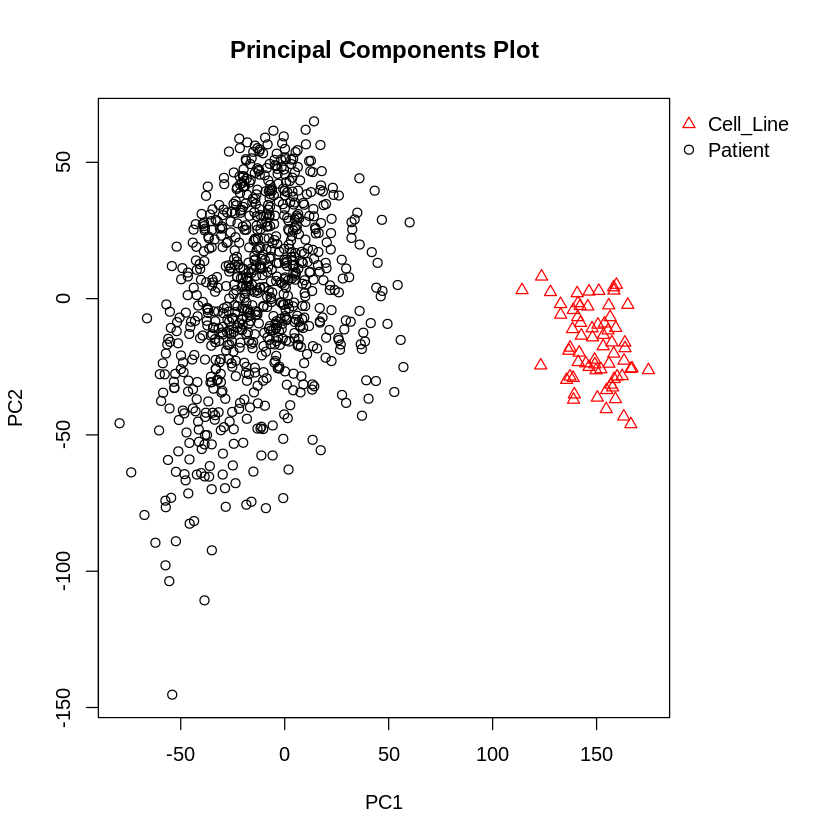

In [6]:
# using PCA to ensure populations are still distinct prior to analysis

symbols = c(rep(2, ncol(MM_cell_line)), rep(1, ncol(MM_patients)))
affycoretools::plotPCA(norm_combined, groupnames = c('Cell_Line', 'Patient'), 
                       pch = symbols, col = symbols, outside = TRUE)

In [7]:
# symbols = c(rep(2, ncol(MM_cell_line)), rep(1, ncol(MM_patients)))
# affycoretools::plotPCA(norm_combined_5000, groupnames = c('Cell_Line', 'Patient'), 
#                        pch = symbols, col = symbols, outside = TRUE)

In [8]:
# utilizing IQR to get vector of top 5000 and top 10000 genes

keepi = apply(norm_pat, 1, IQR)
keepis = sort(keepi, decreasing = TRUE)
keepi5000 = keepi %in% keepis[1:5000]
keepi10000 = keepi %in% keepis[1:10000]

In [9]:
# making function for doing correlation analysis and generating violin plots

makeplots = function(corset, pnames, titl) {
    
    MM.cor.v = cor(corset, method = "s")

    clnames = colnames(MM_cell_line)
    tumor_cell_all = data.frame()

    for(patients in pnames){
        cell_line_tumor_cor = MM.cor.v[patients, clnames]
        cell_line_tumor_cor = data.frame(patient = patients, 
                                         sample = names(cell_line_tumor_cor), cor = cell_line_tumor_cor)
        tumor_cell_all = rbind(tumor_cell_all, cell_line_tumor_cor)
    }

    cell_line_order <- aggregate(cor ~ sample, tumor_cell_all, median)
    cell_line_ordered <- cell_line_order$sample[order(cell_line_order$cor, decreasing=T)]
    tumor_cell_all$sample = factor(tumor_cell_all$sample, levels = cell_line_ordered)

      p <- ggplot(tumor_cell_all, aes(sample, cor))
      print(p + geom_violin()  +  ylab("correlation") + geom_boxplot(width=0.2) + 
              xlab("") + labs(title = titl) +
              stat_summary(geom = "crossbar", width=0.2, fatten=2, color="red", 
                           fun.data = function(x){ return(c(y=median(x), ymin=median(x), ymax=median(x))) }) +  
            theme(panel.background = element_rect(color = 'white'), 
                  axis.text.x = element_text(angle = 70, hjust = 1, size=8)) 
      )
    
}

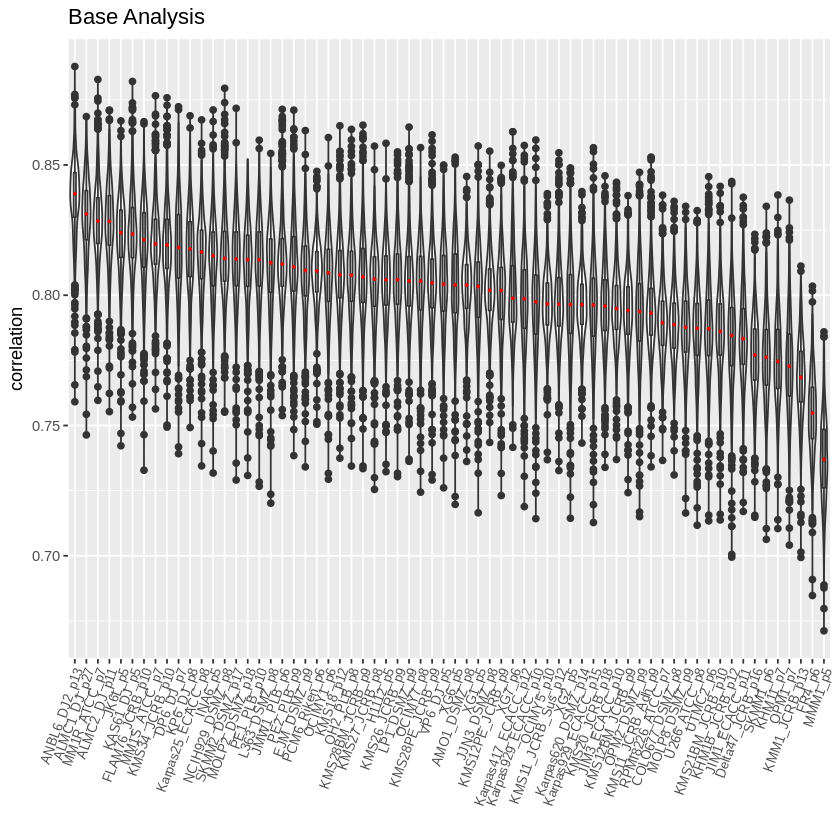

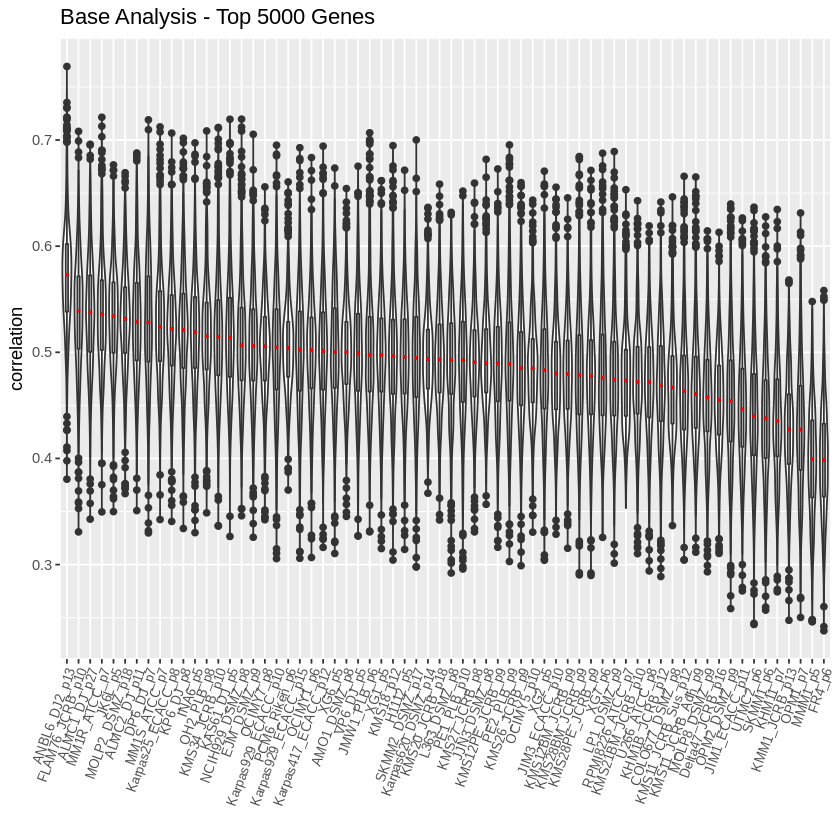

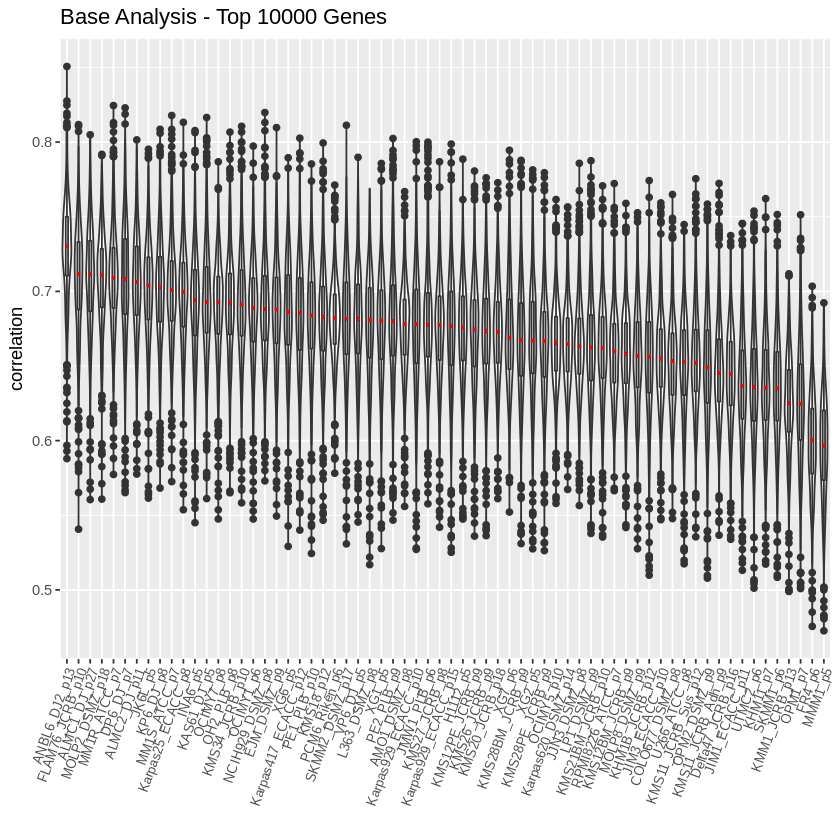

In [10]:
# plots for main analysis using all genes

makeplots(norm_combined, colnames(MM_patients), 'Base Analysis - All Genes')

# subsetting top 5000 / 10000 genes

norm_combined_5000 = norm_combined[keepi5000, ]
norm_combined_10000 = norm_combined[keepi10000, ]

# plots for main analysis using top 5000 / 10000 genes

makeplots(norm_combined_5000, colnames(MM_patients), 'Base Analysis - Top 5000 Genes')
makeplots(norm_combined_10000, colnames(MM_patients), 'Base Analysis - Top 10000 Genes')

In [11]:
#### DATA FOR TRANSLOCATIONS ####

MM_patients_trans = data.frame(fread("IA13a.structural.variants.annot.translocations.clean.maxHom0.8.minMap0.2.clonality.readRange10000bp.cnvRange2000bp.common.txt"))
MM_patient_trans_ids = MM_patients_trans[,'sample']

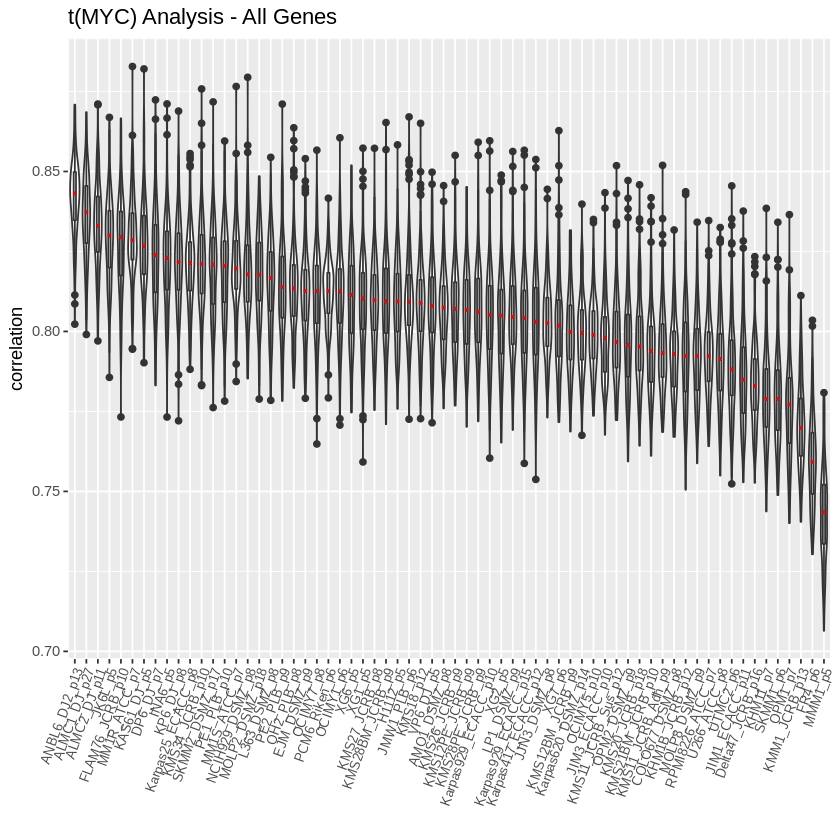

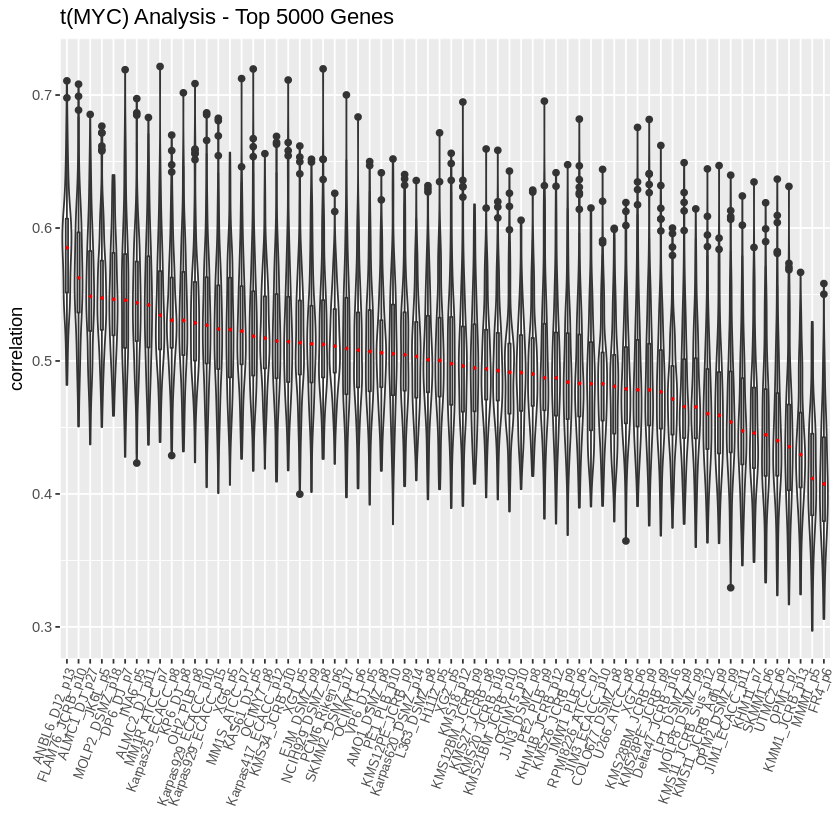

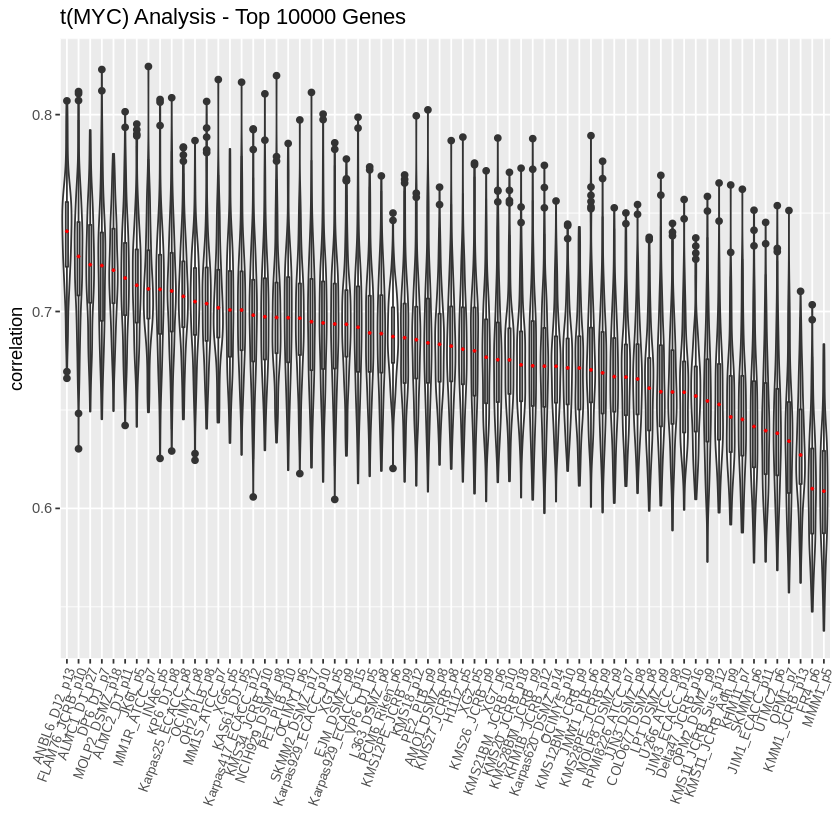

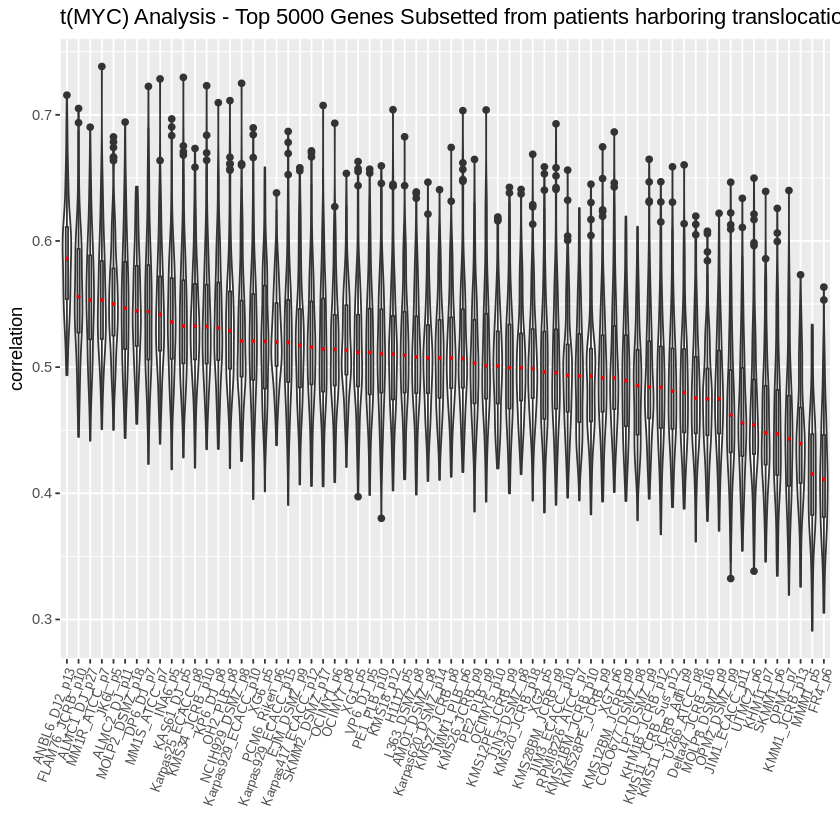

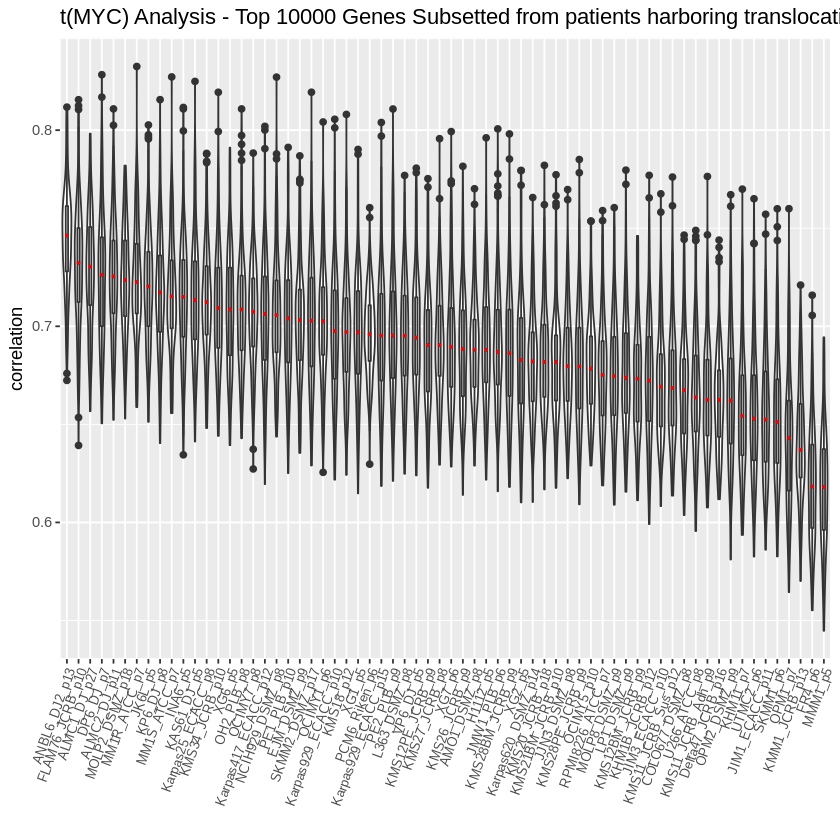

In [12]:
# extracting patients with MYC translocation who are also newly diagnosed

keepMYC = as.logical(MM_patients_trans[,'t.MYC.'])
MM_patients_trans_MYC = MM_patient_trans_ids[keepMYC]
MM_patients_trans_MYC = unique(MM_patients_trans_MYC)
MM_patients_new_trans_MYC = filter(as.data.frame(MM_patients_trans_MYC),
                                   str_extract(as.data.frame(MM_patients_trans_MYC)[,1], "_[0-9]_") == "_1_")
keepcMYC = colnames(MM_patients) %in% MM_patients_new_trans_MYC[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_MYC = norm_pat[,keepcMYC]
norm_combined_MYC = cbind(norm_cell, norm_pat_MYC)
norm_combined_MYC_5000 = norm_combined_MYC[keepi5000, ]
norm_combined_MYC_10000 = norm_combined_MYC[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

makeplots(norm_combined_MYC, colnames(norm_pat_MYC), 't(MYC) Analysis - All Genes')
makeplots(norm_combined_MYC_5000, colnames(norm_pat_MYC), 't(MYC) Analysis - Top 5000 Genes')
makeplots(norm_combined_MYC_10000, colnames(norm_pat_MYC), 't(MYC) Analysis - Top 10000 Genes')

# determining top 5000 / 10000 genes from only patients that have MYC transloation

keepi_tMYC = apply(norm_pat_MYC, 1, IQR)
keepis_tMYC = sort(keepi_tMYC, decreasing = TRUE)
keepi_tMYC_5000 = keepi_tMYC %in% keepis_tMYC[1:5000]
keepi_tMYC_10000 = keepi_tMYC %in% keepis_tMYC[1:10000]

# subsetting norm_pat to keep newly filtered genes

norm_combined_MYC_u_5000 = norm_combined_MYC[keepi_tMYC_5000, ]
norm_combined_MYC_u_10000 = norm_combined_MYC[keepi_tMYC_10000, ]

# plots using newly filtered genes

makeplots(norm_combined_MYC_u_5000, colnames(norm_pat_MYC), 't(MYC) Analysis - Top 5000 Genes Subsetted from patients harboring translocation')
makeplots(norm_combined_MYC_u_10000, colnames(norm_pat_MYC), 't(MYC) Analysis - Top 10000 Genes Subsetted from patients harboring translocation')


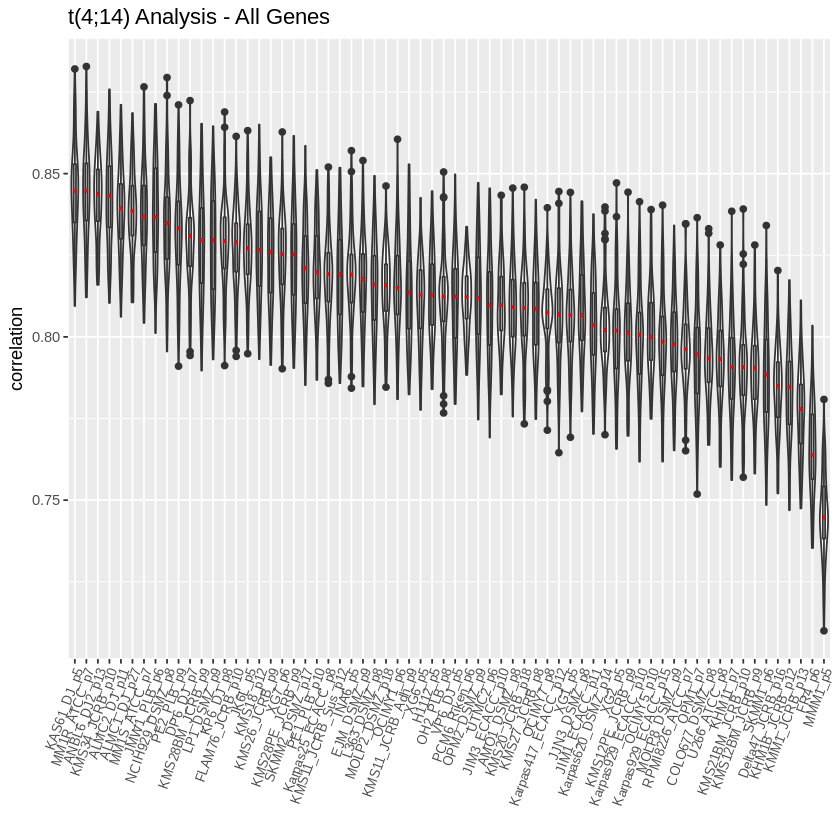

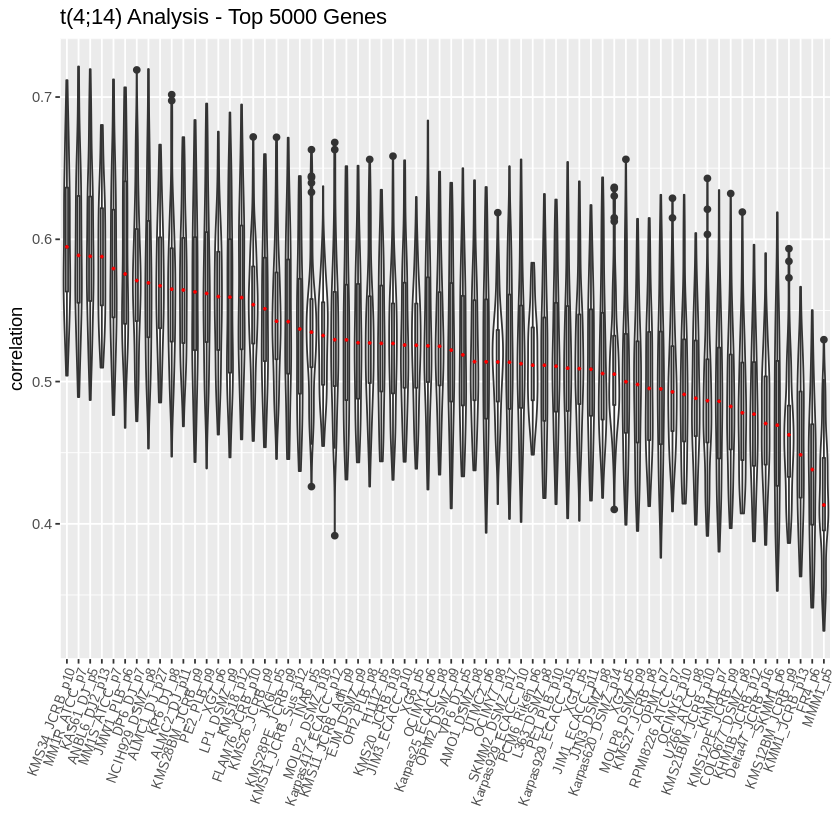

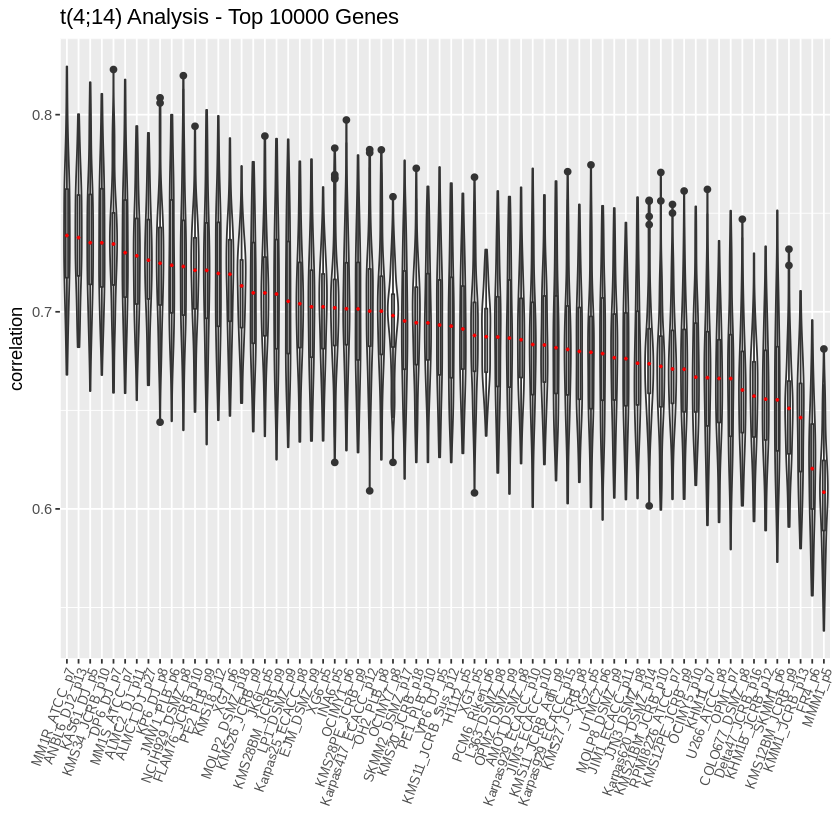

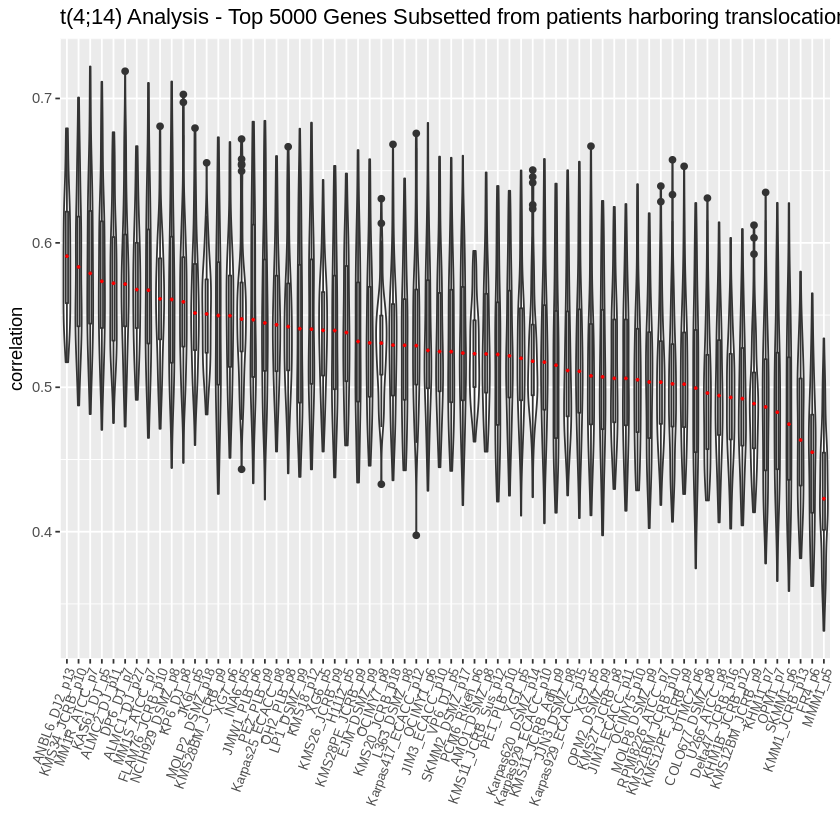

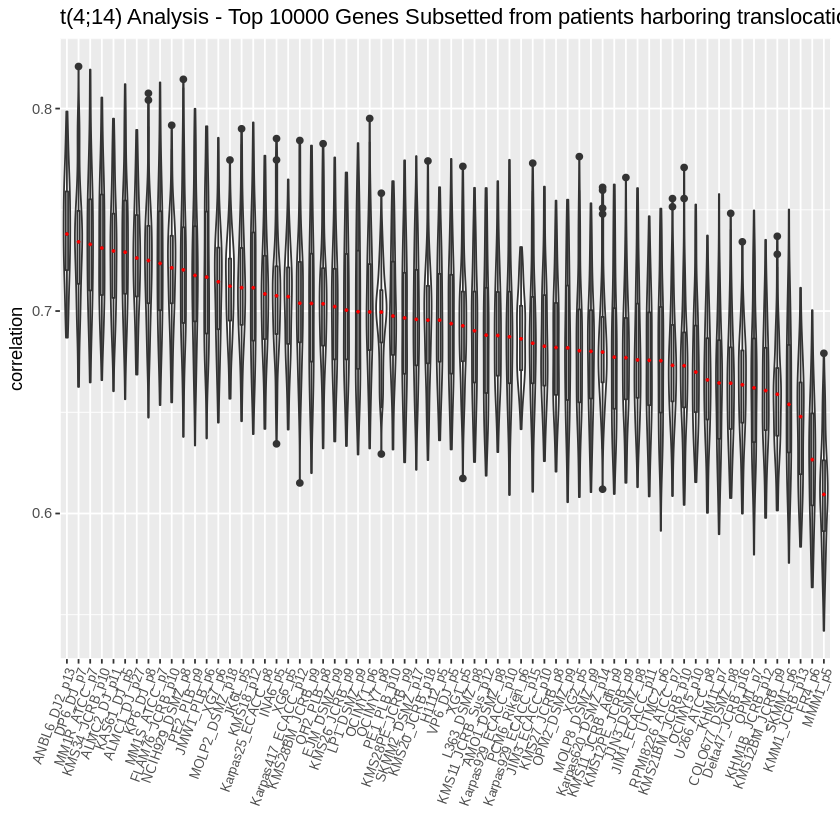

In [13]:
# extracting patients with 4;14 translocation who are also newly diagnosed

keep414 = as.logical(MM_patients_trans[,'t.4.14.'])
MM_patients_trans_414 = MM_patient_trans_ids[keep414]
MM_patients_trans_414 = unique(MM_patients_trans_414)
MM_patients_new_trans_414 = filter(as.data.frame(MM_patients_trans_414),
                                   str_extract(as.data.frame(MM_patients_trans_414)[,1], "_[0-9]_") == "_1_")
keepc414 = colnames(MM_patients) %in% MM_patients_new_trans_414[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_414 = norm_pat[,keepc414]
norm_combined_414 = cbind(norm_cell, norm_pat_414)
norm_combined_414_5000 = norm_combined_414[keepi5000, ]
norm_combined_414_10000 = norm_combined_414[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

makeplots(norm_combined_414, colnames(norm_pat_414), 't(4;14) Analysis - All Genes')
makeplots(norm_combined_414_5000, colnames(norm_pat_414), 't(4;14) Analysis - Top 5000 Genes')
makeplots(norm_combined_414_10000, colnames(norm_pat_414), 't(4;14) Analysis - Top 10000 Genes')

# determining top 5000 / 10000 genes from only patients that have 4;14 transloation

keepi_t414 = apply(norm_pat_414, 1, IQR)
keepis_t414 = sort(keepi_t414, decreasing = TRUE)
keepi_t414_5000 = keepi_t414 %in% keepis_t414[1:5000]
keepi_t414_10000 = keepi_t414 %in% keepis_t414[1:10000]

# subsetting norm_pat to keep newly filtered genes

norm_combined_414_u_5000 = norm_combined_414[keepi_t414_5000, ]
norm_combined_414_u_10000 = norm_combined_414[keepi_t414_10000, ]

# plots using newly filtered genes

makeplots(norm_combined_414_u_5000, colnames(norm_pat_414), 't(4;14) Analysis - Top 5000 Genes Subsetted from patients harboring translocation')
makeplots(norm_combined_414_u_10000, colnames(norm_pat_414), 't(4;14) Analysis - Top 10000 Genes Subsetted from patients harboring translocation')


In [14]:
# #norm_combined_5000
# cor_414 = cor(norm_combined_414_5000, method = "s")
# #norm_combined_414_5000
# head(cor_414)
# cor_414[1,'MMRF_1497_1_BM']
# cor2check[1,'MMRF_1497_1_BM']
# head(cor2check)

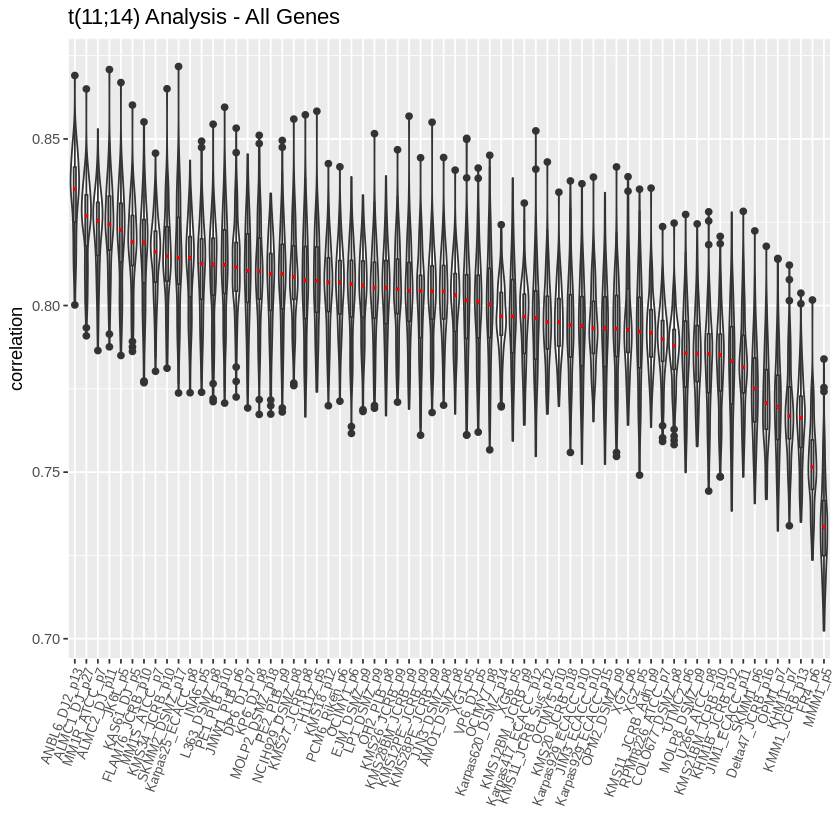

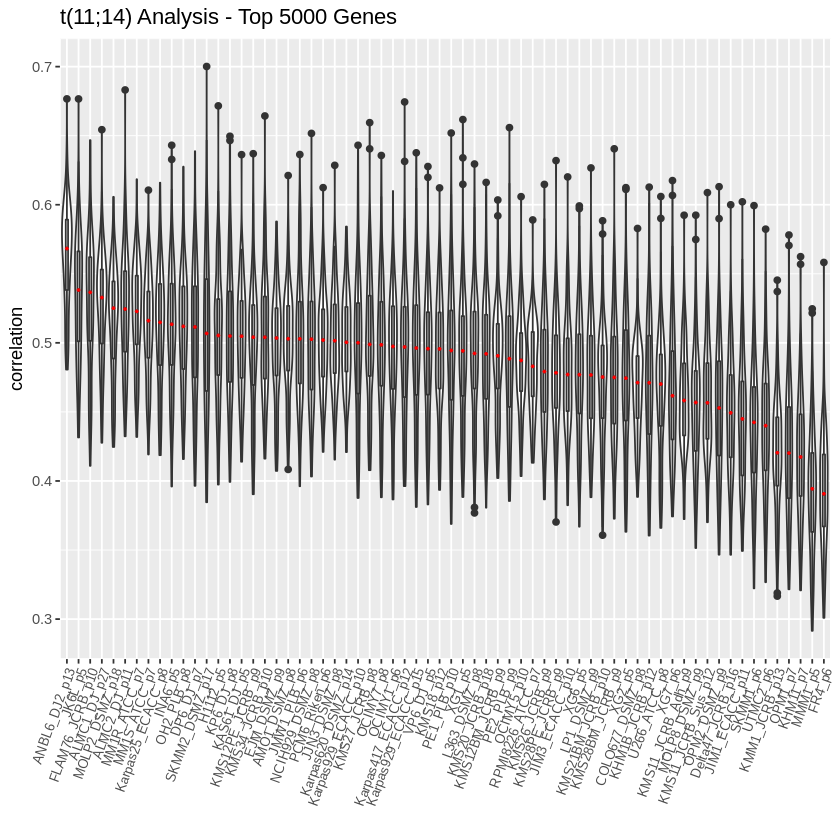

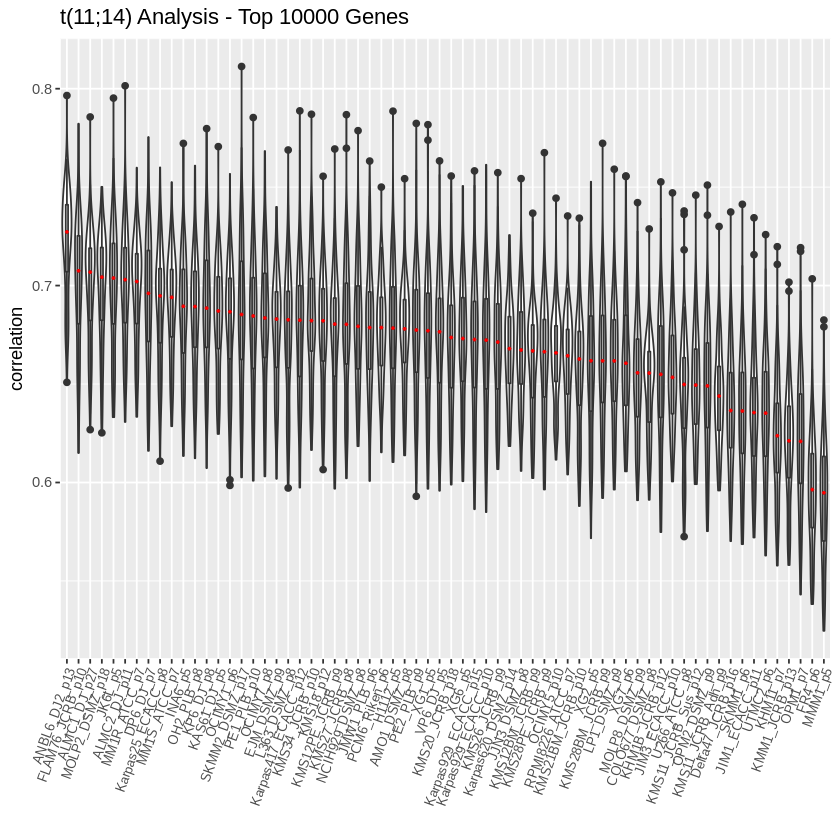

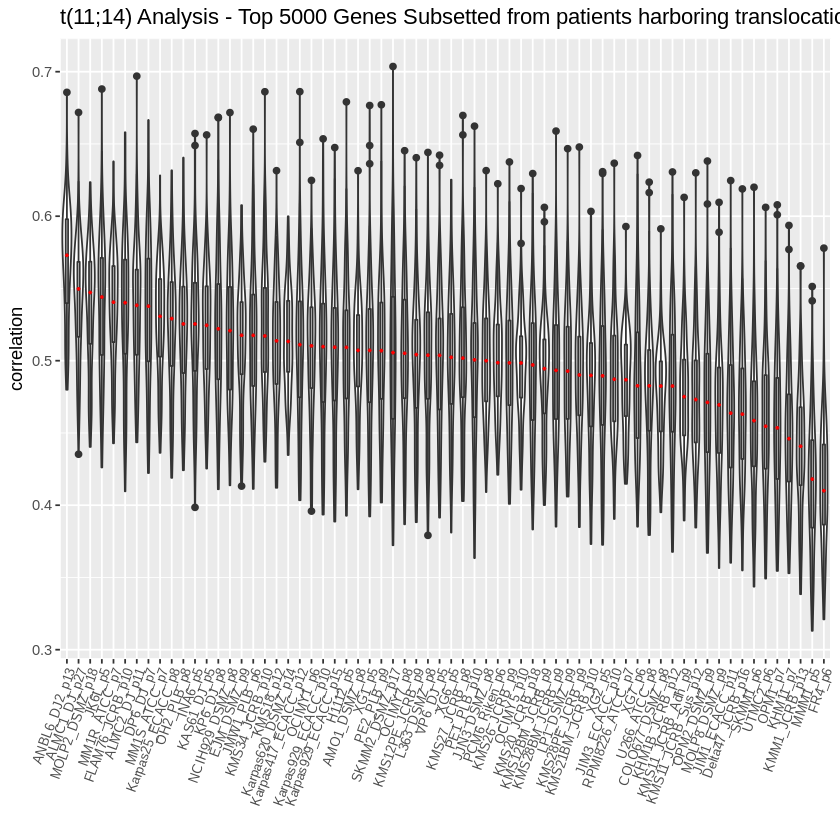

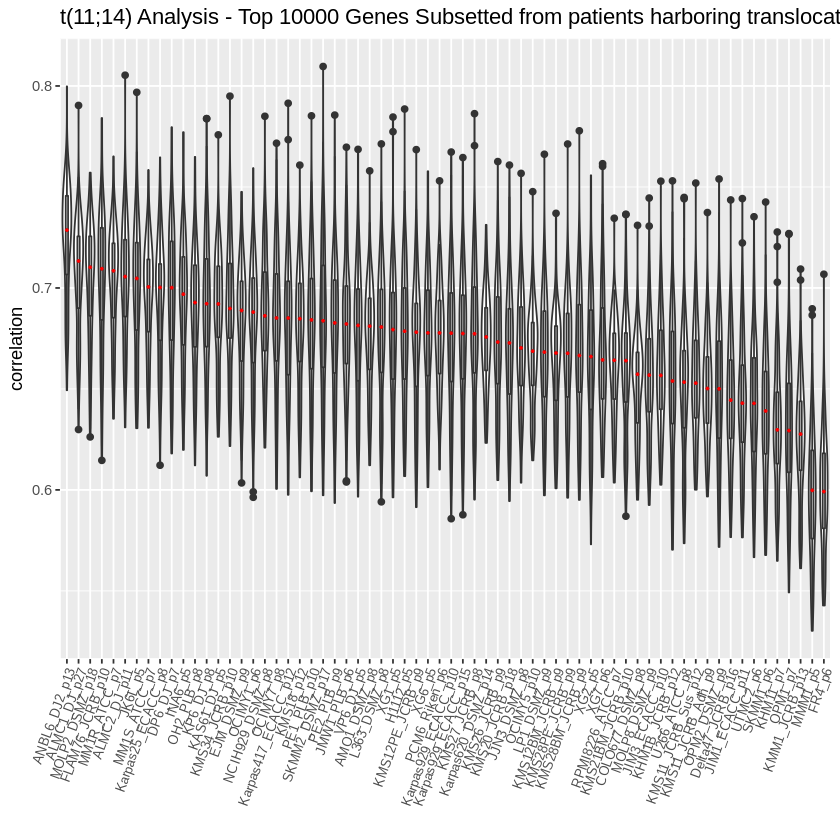

In [15]:
# extracting patients with 11;14 translocation who are also newly diagnosed

keep1114 = as.logical(MM_patients_trans[,'t.11.14.'])
MM_patients_trans_1114 = MM_patient_trans_ids[keep1114]
MM_patients_trans_1114 = unique(MM_patients_trans_1114)
MM_patients_new_trans_1114 = filter(as.data.frame(MM_patients_trans_1114),
                                   str_extract(as.data.frame(MM_patients_trans_1114)[,1], "_[0-9]_") == "_1_")
keepc1114 = colnames(MM_patients) %in% MM_patients_new_trans_1114[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_1114 = norm_pat[,keepc1114]
norm_combined_1114 = cbind(norm_cell, norm_pat_1114)
norm_combined_1114_5000 = norm_combined_1114[keepi5000, ]
norm_combined_1114_10000 = norm_combined_1114[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

makeplots(norm_combined_1114, colnames(norm_pat_1114), 't(11;14) Analysis - All Genes')
makeplots(norm_combined_1114_5000, colnames(norm_pat_1114), 't(11;14) Analysis - Top 5000 Genes')
makeplots(norm_combined_1114_10000, colnames(norm_pat_1114), 't(11;14) Analysis - Top 10000 Genes')

# determining top 5000 / 10000 genes from only patients that have 11;14 transloation

keepi_t1114 = apply(norm_pat_1114, 1, IQR)
keepis_t1114 = sort(keepi_t1114, decreasing = TRUE)
keepi_t1114_5000 = keepi_t1114 %in% keepis_t1114[1:5000]
keepi_t1114_10000 = keepi_t1114 %in% keepis_t1114[1:10000]

# subsetting norm_pat to keep newly filtered genes

norm_combined_1114_u_5000 = norm_combined_1114[keepi_t1114_5000, ]
norm_combined_1114_u_10000 = norm_combined_1114[keepi_t1114_10000, ]

# plots using newly filtered genes

makeplots(norm_combined_1114_u_5000, colnames(norm_pat_1114), 't(11;14) Analysis - Top 5000 Genes Subsetted from patients harboring translocation')
makeplots(norm_combined_1114_u_10000, colnames(norm_pat_1114), 't(11;14) Analysis - Top 10000 Genes Subsetted from patients harboring translocation')

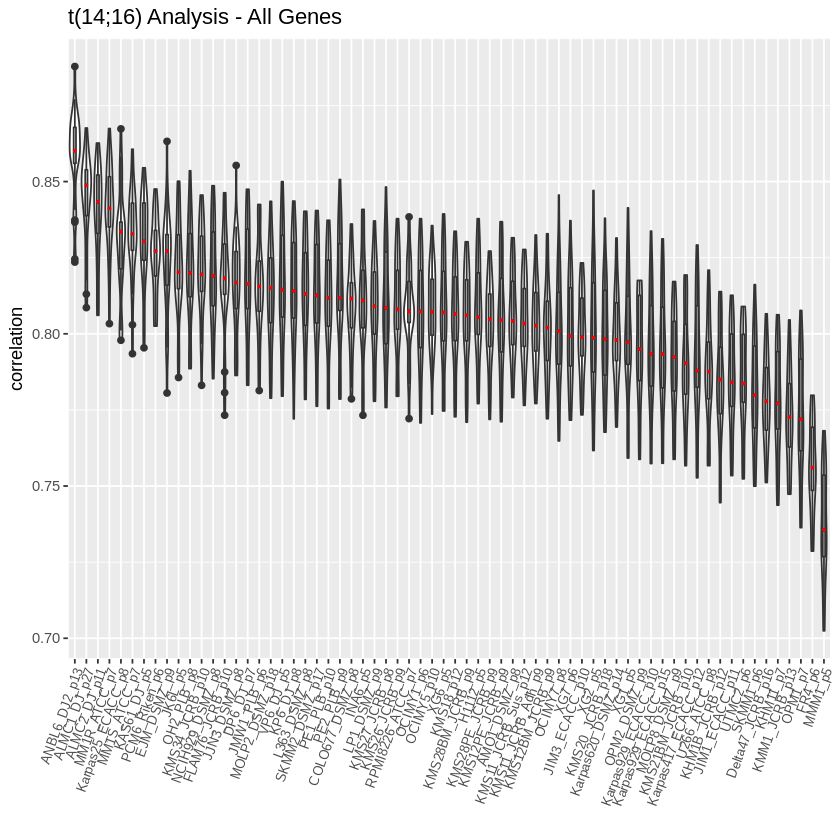

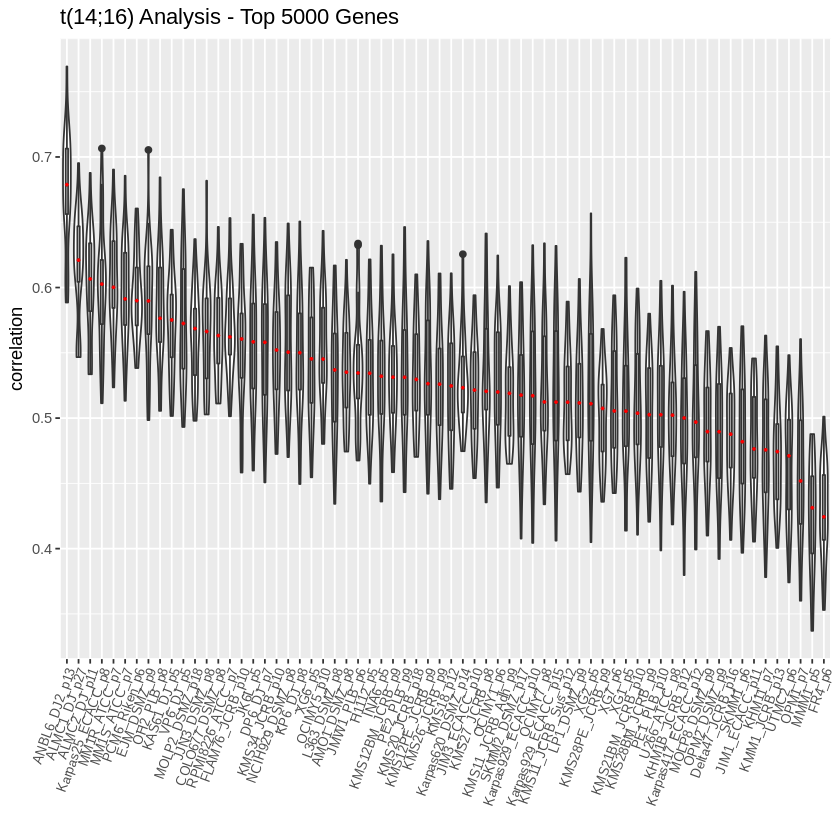

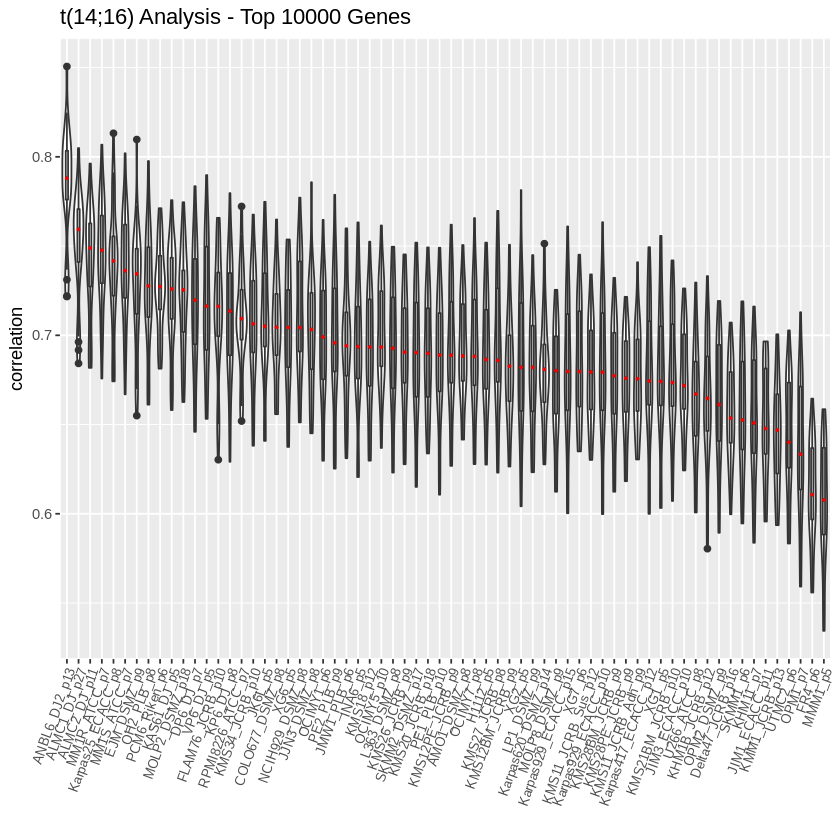

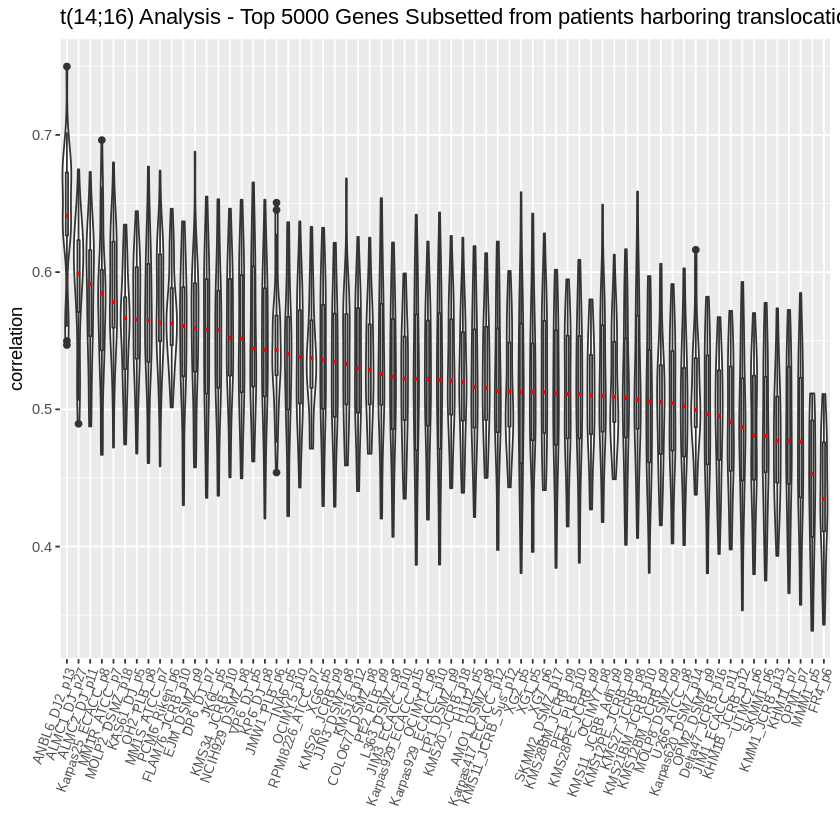

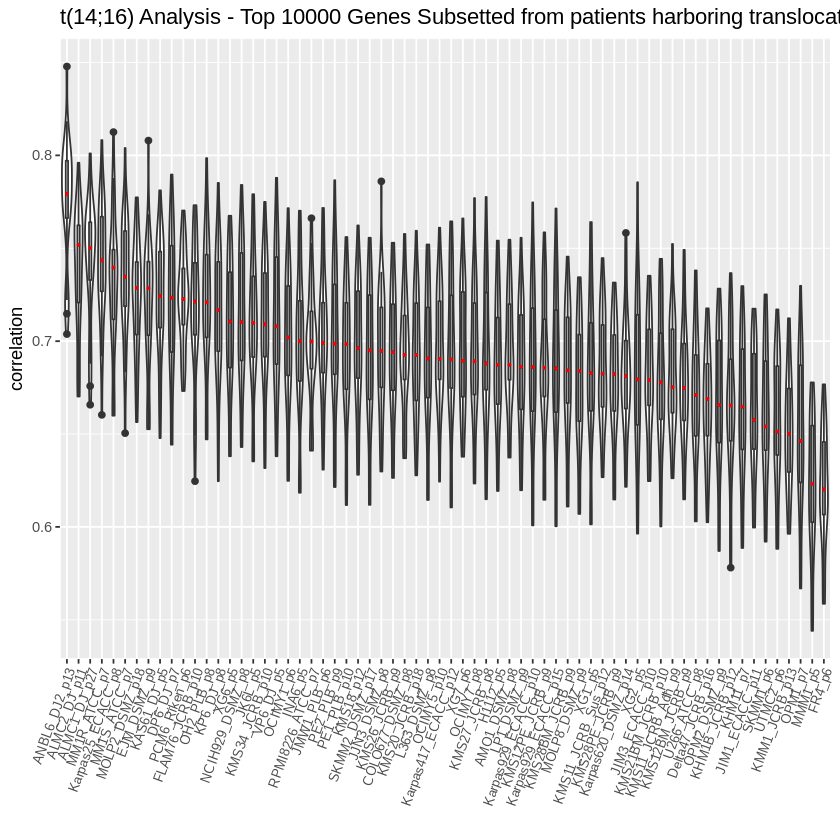

In [16]:
# extracting patients with 14;16 translocation who are also newly diagnosed

keep1416 = as.logical(MM_patients_trans[,'t.14.16.'])
MM_patients_trans_1416 = MM_patient_trans_ids[keep1416]
MM_patients_trans_1416 = unique(MM_patients_trans_1416)
MM_patients_new_trans_1416 = filter(as.data.frame(MM_patients_trans_1416),
                                   str_extract(as.data.frame(MM_patients_trans_1416)[,1], "_[0-9]_") == "_1_")
keepc1416 = colnames(MM_patients) %in% MM_patients_new_trans_1416[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_1416 = norm_pat[,keepc1416]
norm_combined_1416 = cbind(norm_cell, norm_pat_1416)
norm_combined_1416_5000 = norm_combined_1416[keepi5000, ]
norm_combined_1416_10000 = norm_combined_1416[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

makeplots(norm_combined_1416, colnames(norm_pat_1416), 't(14;16) Analysis - All Genes')
makeplots(norm_combined_1416_5000, colnames(norm_pat_1416), 't(14;16) Analysis - Top 5000 Genes')
makeplots(norm_combined_1416_10000, colnames(norm_pat_1416), 't(14;16) Analysis - Top 10000 Genes')

# determining top 5000 / 10000 genes from only patients that have 14;16 transloation

keepi_t1416 = apply(norm_pat_1416, 1, IQR)
keepis_t1416 = sort(keepi_t1416, decreasing = TRUE)
keepi_t1416_5000 = keepi_t1416 %in% keepis_t1416[1:5000]
keepi_t1416_10000 = keepi_t1416 %in% keepis_t1416[1:10000]

# subsetting norm_pat to keep newly filtered genes

norm_combined_1416_u_5000 = norm_combined_1416[keepi_t1416_5000, ]
norm_combined_1416_u_10000 = norm_combined_1416[keepi_t1416_10000, ]

# plots using newly filtered genes

makeplots(norm_combined_1416_u_5000, colnames(norm_pat_1416), 't(14;16) Analysis - Top 5000 Genes Subsetted from patients harboring translocation')
makeplots(norm_combined_1416_u_10000, colnames(norm_pat_1416), 't(14;16) Analysis - Top 10000 Genes Subsetted from patients harboring translocation')

In [17]:
#### Cell line info ####

MM_pat_mut = read.delim("MMRF_CoMMpass_IA13a_IGV_All_Canonical_Variants.mut", stringsAsFactors = F)

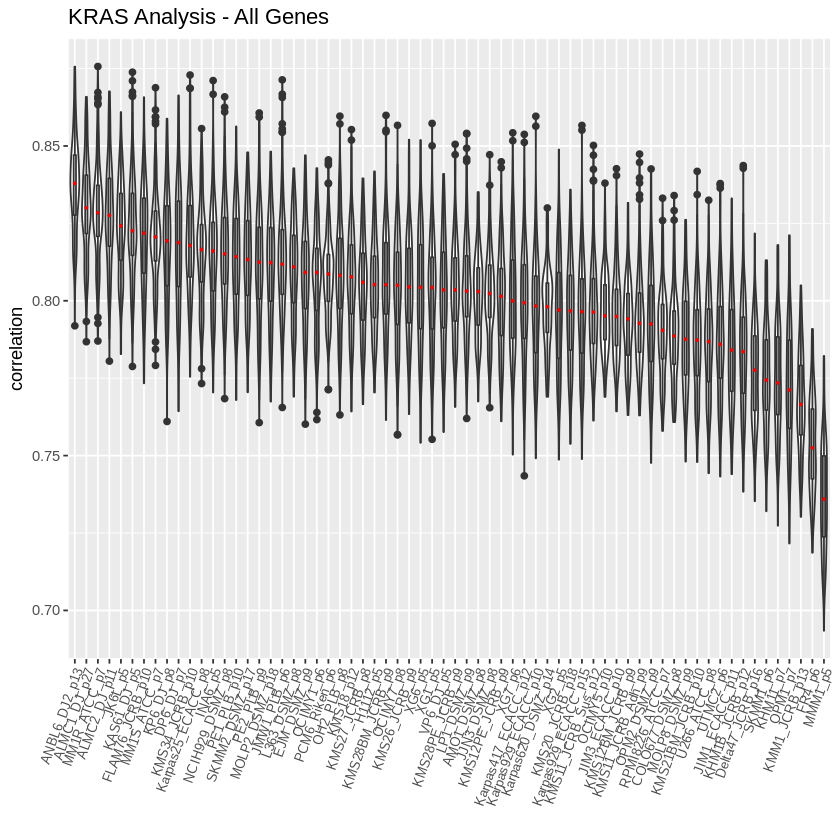

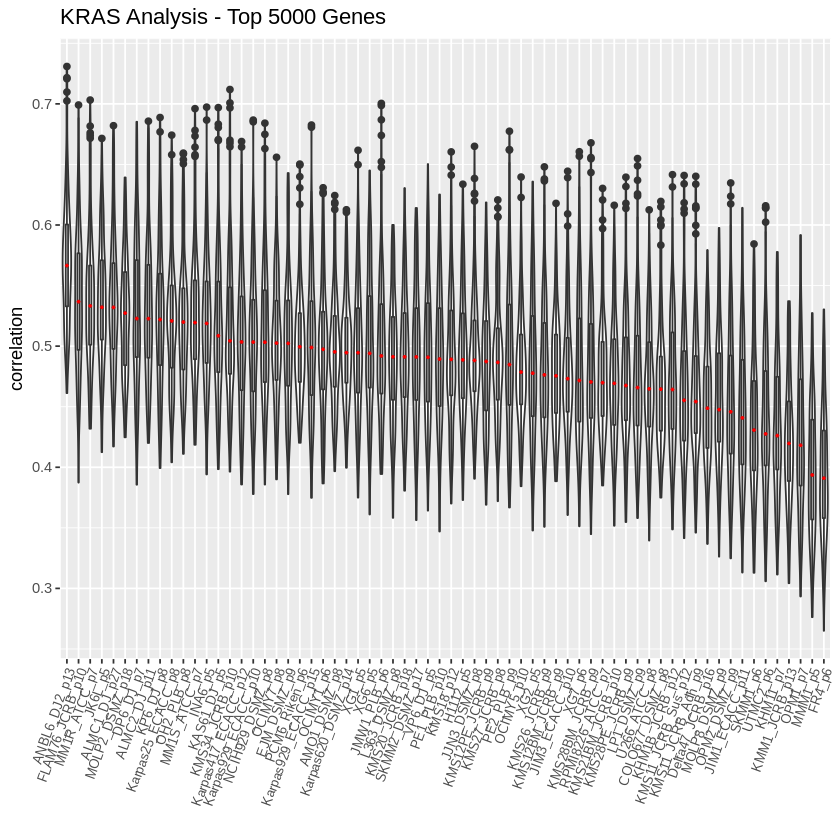

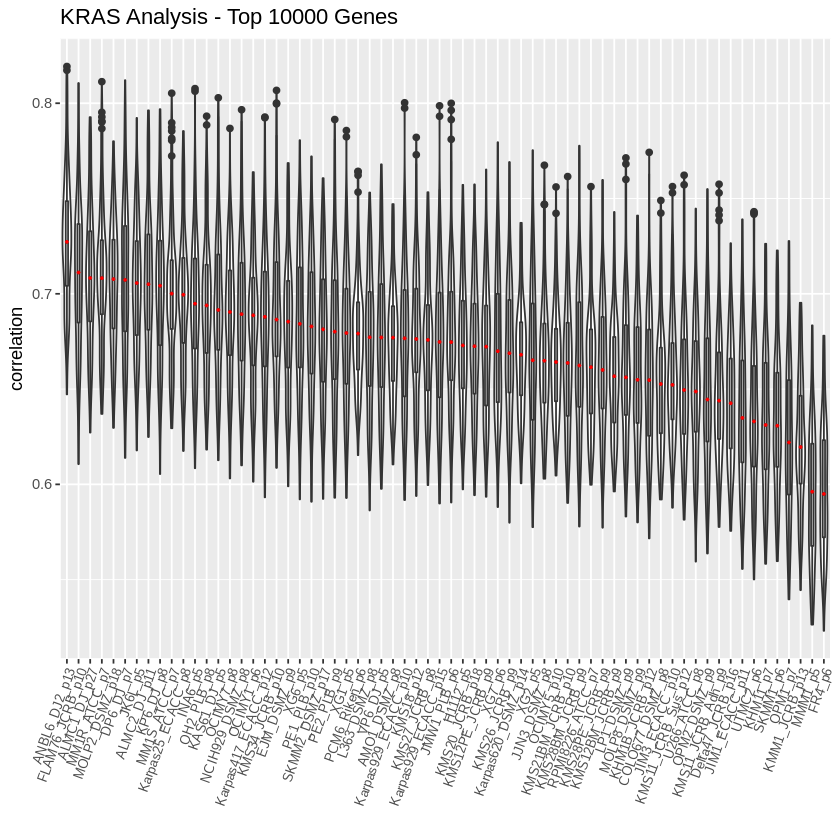

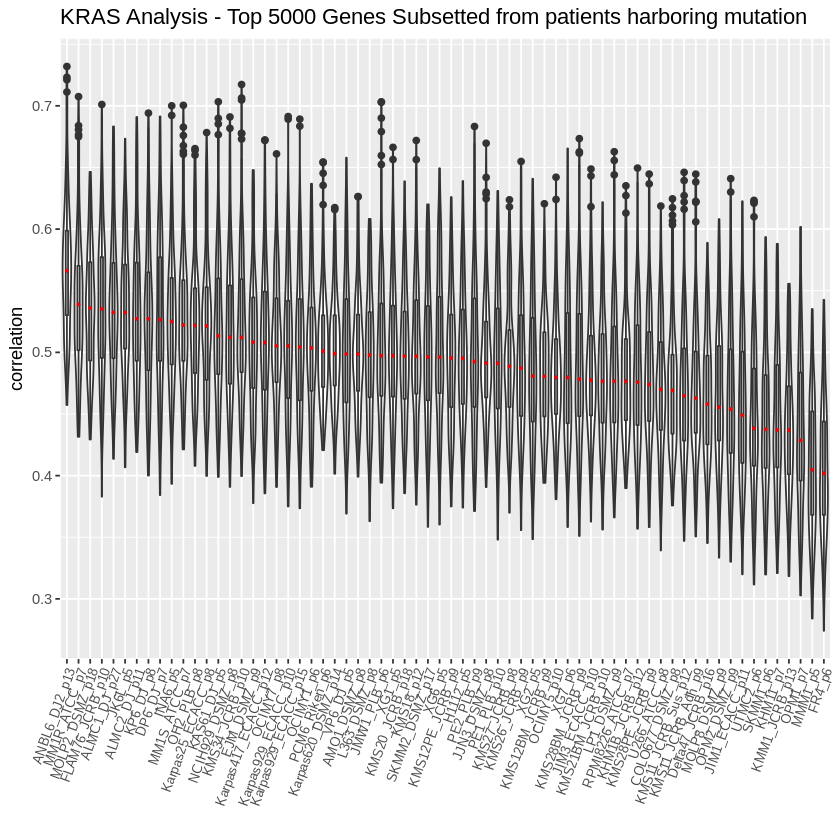

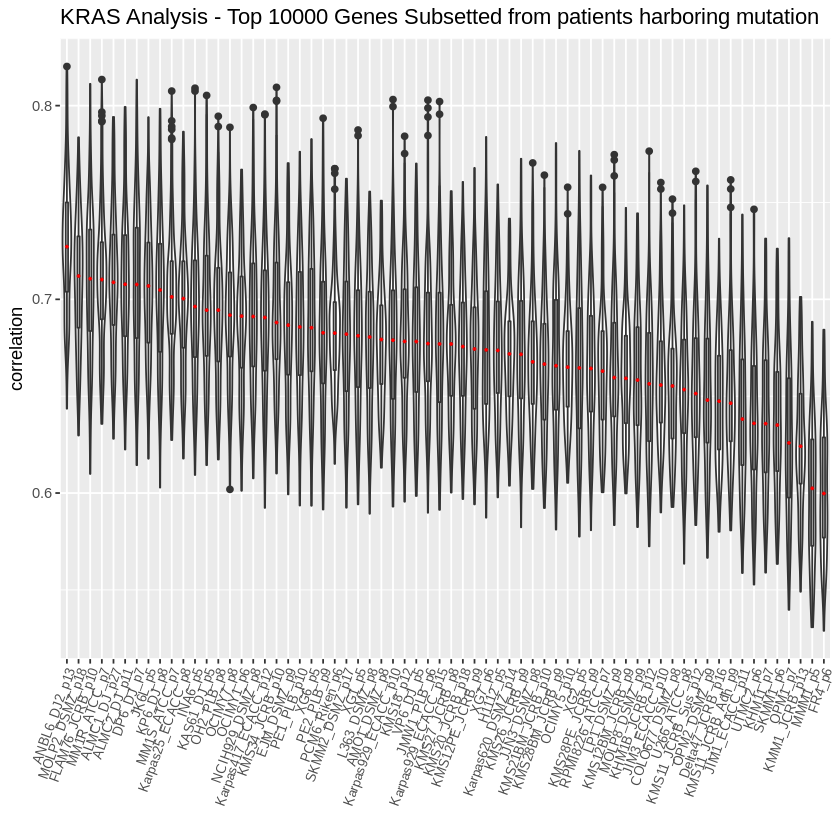

In [18]:
# extracting patients with KRAS mutation who are also newly diagnosed

KRAS_mut = filter(MM_pat_mut, GENE == "KRAS") %>%
  select(sample, EFFECT, HGVS_P, FEATURE) %>%
  filter(EFFECT == "missense_variant") %>%
  mutate(position = str_extract(HGVS_P, "[0-9]+")) %>%
  filter(position %in% c(12, 13, 61))

MM_pat_mut_KRAS = unique(KRAS_mut$sample)
keepcKRAS = colnames(MM_patients) %in% MM_pat_mut_KRAS

# subsetting norm_pat to those patients with mutation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_KRAS = norm_pat[,keepcKRAS]
norm_combined_KRAS = cbind(norm_cell, norm_pat_KRAS)
norm_combined_KRAS_5000 = norm_combined_KRAS[keepi5000, ]
norm_combined_KRAS_10000 = norm_combined_KRAS[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

makeplots(norm_combined_KRAS, colnames(norm_pat_KRAS), 'KRAS Analysis - All Genes')
makeplots(norm_combined_KRAS_5000, colnames(norm_pat_KRAS), 'KRAS Analysis - Top 5000 Genes')
makeplots(norm_combined_KRAS_10000, colnames(norm_pat_KRAS), 'KRAS Analysis - Top 10000 Genes')

# determining top 5000 / 10000 genes from only patients that have 14;16 transloation

keepi_KRAS = apply(norm_pat_KRAS, 1, IQR)
keepis_KRAS = sort(keepi_KRAS, decreasing = TRUE)
keepi_KRAS_5000 = keepi_KRAS %in% keepis_KRAS[1:5000]
keepi_KRAS_10000 = keepi_KRAS %in% keepis_KRAS[1:10000]

# subsetting norm_pat to keep newly filtered genes

norm_combined_KRAS_u_5000 = norm_combined_KRAS[keepi_KRAS_5000, ]
norm_combined_KRAS_u_10000 = norm_combined_KRAS[keepi_KRAS_10000, ]

# plots using newly filtered genes

makeplots(norm_combined_KRAS_u_5000, colnames(norm_pat_KRAS), 'KRAS Analysis - Top 5000 Genes Subsetted from patients harboring mutation')
makeplots(norm_combined_KRAS_u_10000, colnames(norm_pat_KRAS), 'KRAS Analysis - Top 10000 Genes Subsetted from patients harboring mutation')

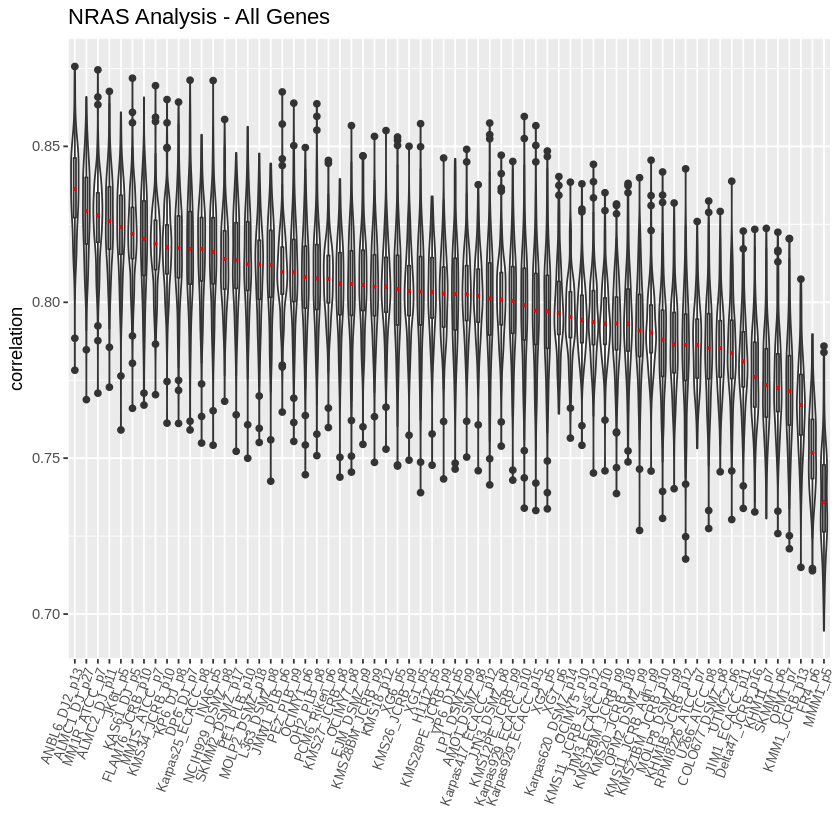

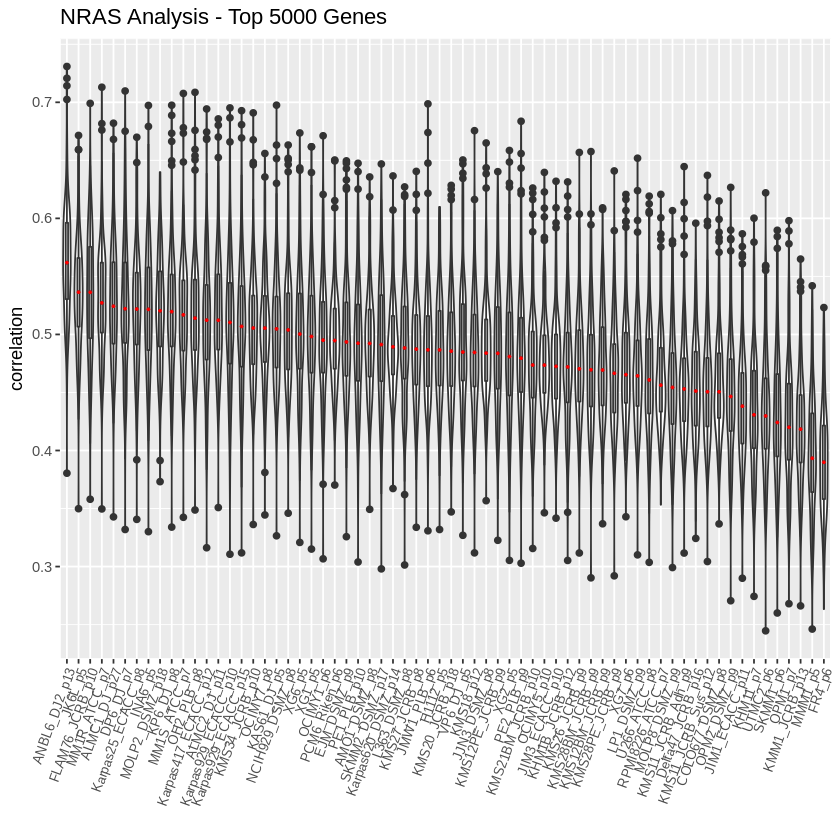

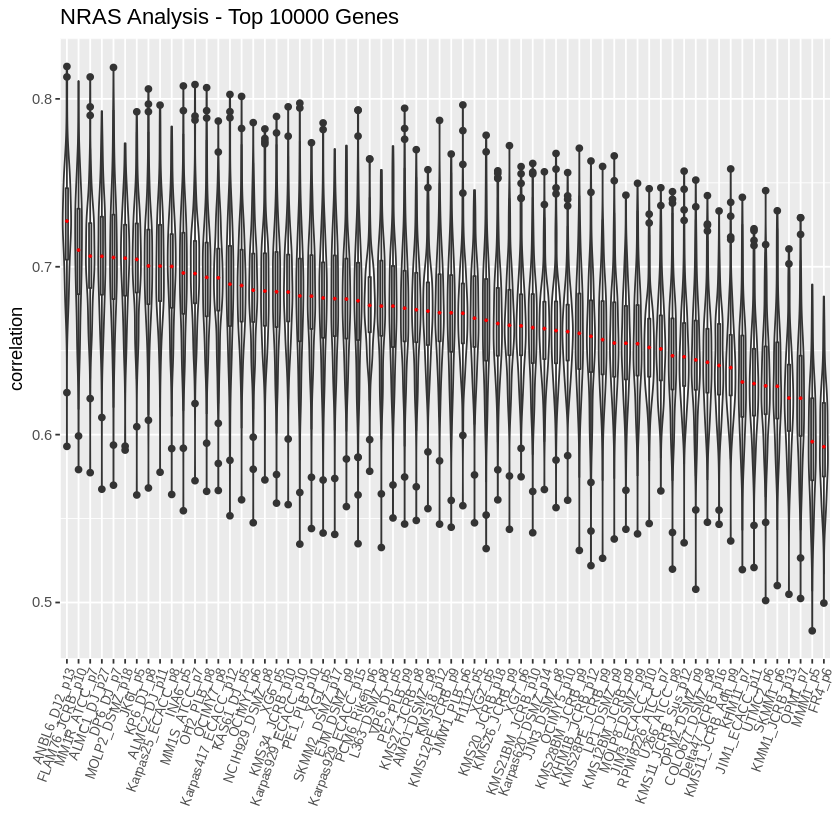

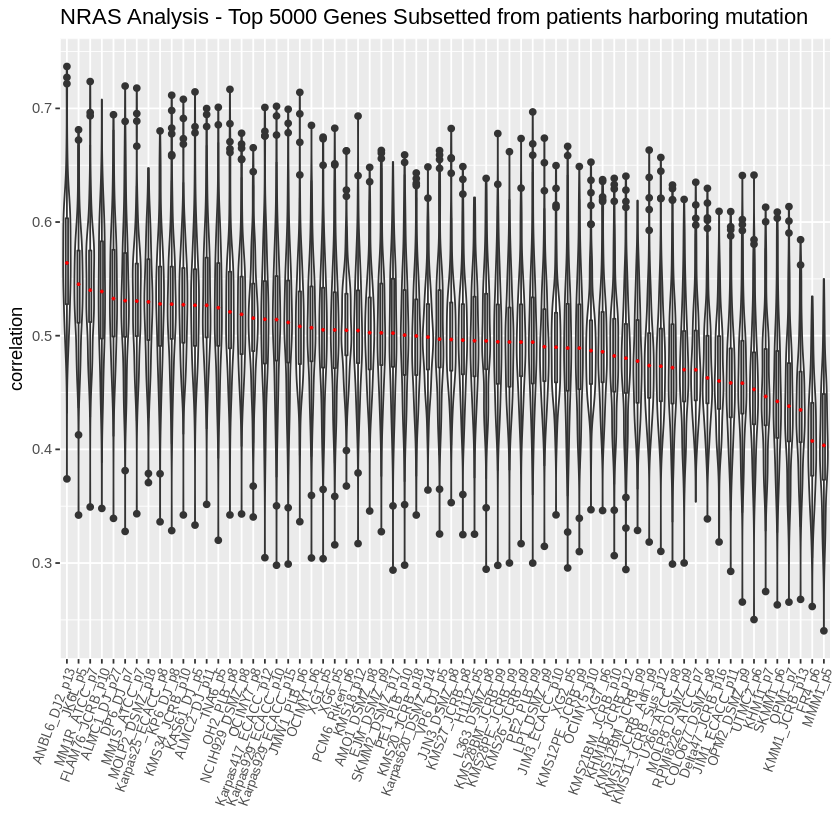

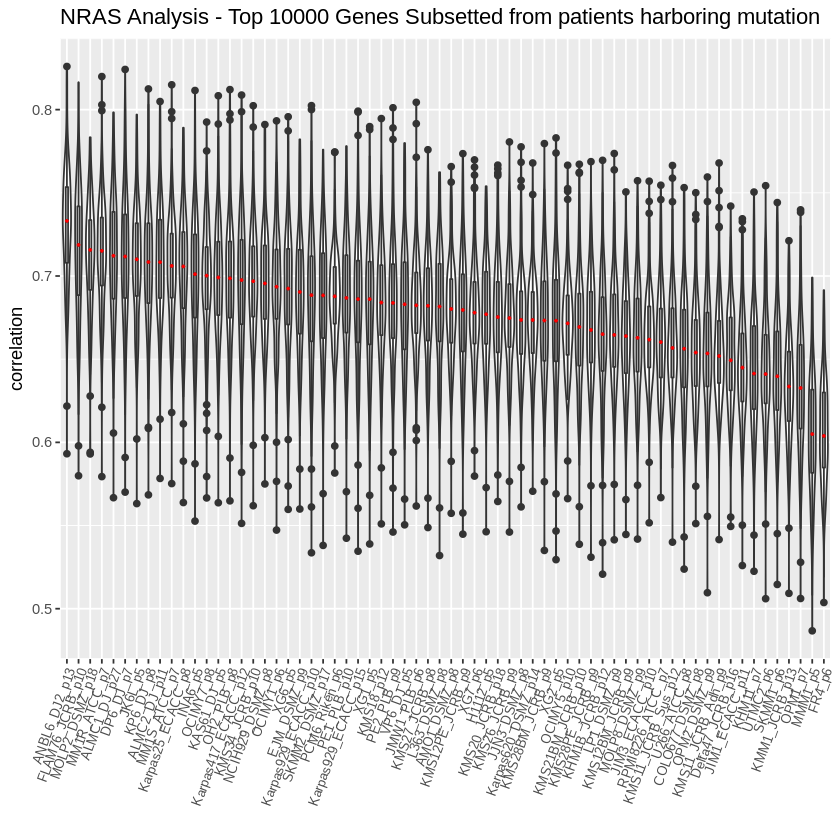

In [19]:
# extracting patients with NRAS mutation who are also newly diagnosed

NRAS_mut = filter(MM_pat_mut, GENE == "NRAS") %>%
  select(sample, EFFECT, HGVS_P, FEATURE) %>%
  filter(EFFECT == "missense_variant") %>%
  mutate(position = str_extract(HGVS_P, "[0-9]+")) %>%
  filter(position %in% c(12, 13, 61))

MM_pat_mut_NRAS = unique(NRAS_mut$sample)
keepcNRAS = colnames(MM_patients) %in% MM_pat_mut_NRAS

# subsetting norm_pat to those patients with mutation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_NRAS = norm_pat[,keepcNRAS]
norm_combined_NRAS = cbind(norm_cell, norm_pat_NRAS)
norm_combined_NRAS_5000 = norm_combined_NRAS[keepi5000, ]
norm_combined_NRAS_10000 = norm_combined_NRAS[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

makeplots(norm_combined_NRAS, colnames(norm_pat_NRAS), 'NRAS Analysis - All Genes')
makeplots(norm_combined_NRAS_5000, colnames(norm_pat_NRAS), 'NRAS Analysis - Top 5000 Genes')
makeplots(norm_combined_NRAS_10000, colnames(norm_pat_NRAS), 'NRAS Analysis - Top 10000 Genes')

# determining top 5000 / 10000 genes from only patients that have 14;16 transloation

keepi_NRAS = apply(norm_pat_NRAS, 1, IQR)
keepis_NRAS = sort(keepi_NRAS, decreasing = TRUE)
keepi_NRAS_5000 = keepi_NRAS %in% keepis_NRAS[1:5000]
keepi_NRAS_10000 = keepi_NRAS %in% keepis_NRAS[1:10000]

# subsetting norm_pat to keep newly filtered genes

norm_combined_NRAS_u_5000 = norm_combined_NRAS[keepi_NRAS_5000, ]
norm_combined_NRAS_u_10000 = norm_combined_NRAS[keepi_NRAS_10000, ]

# plots using newly filtered genes

makeplots(norm_combined_NRAS_u_5000, colnames(norm_pat_NRAS), 'NRAS Analysis - Top 5000 Genes Subsetted from patients harboring mutation')
makeplots(norm_combined_NRAS_u_10000, colnames(norm_pat_NRAS), 'NRAS Analysis - Top 10000 Genes Subsetted from patients harboring mutation')

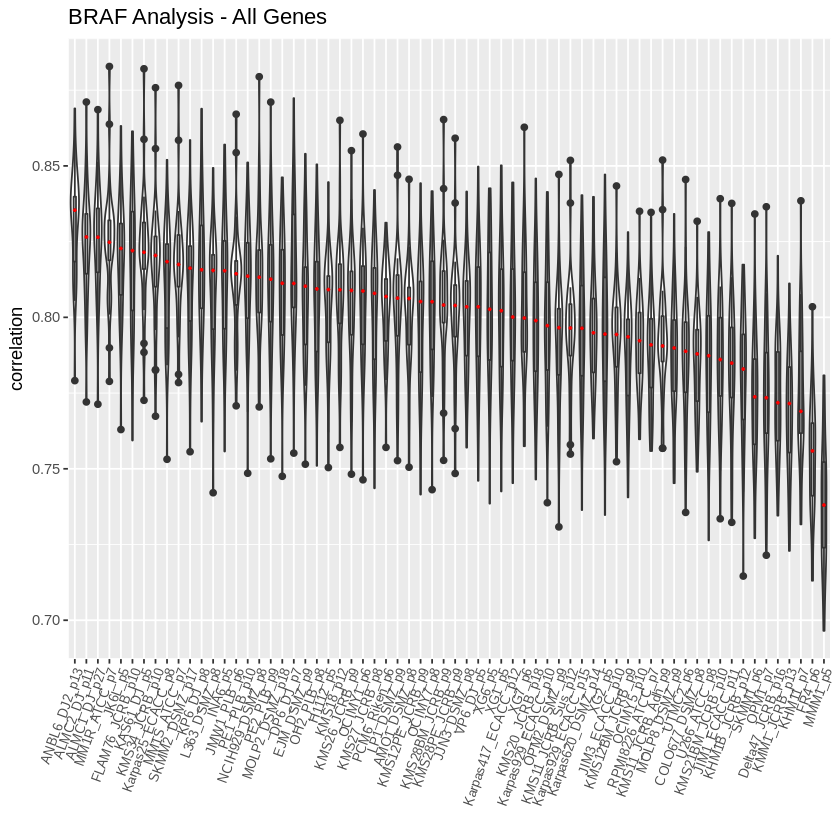

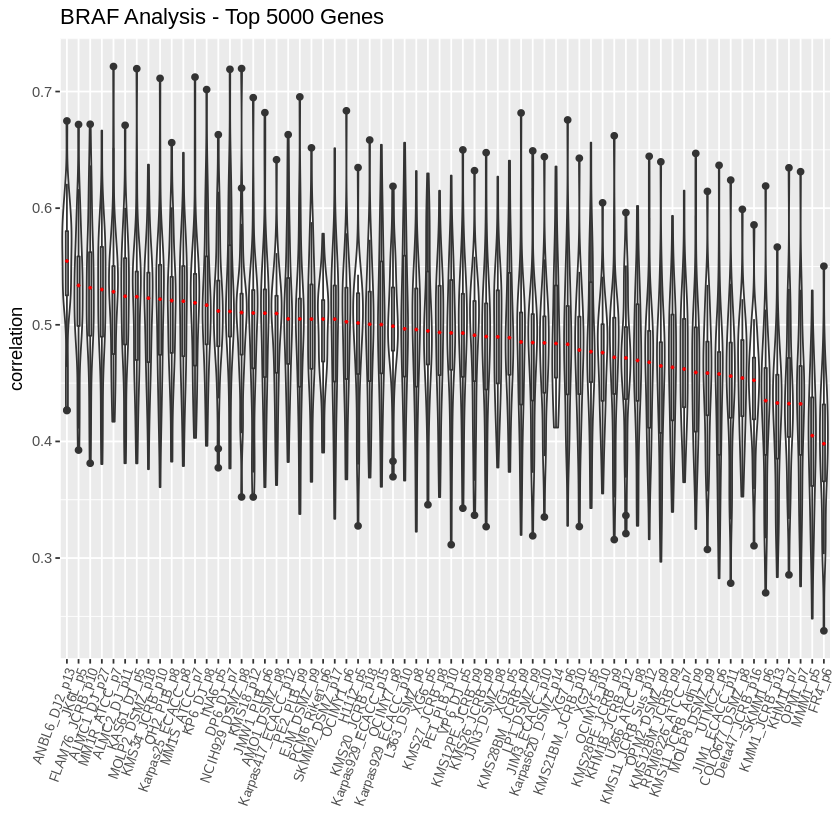

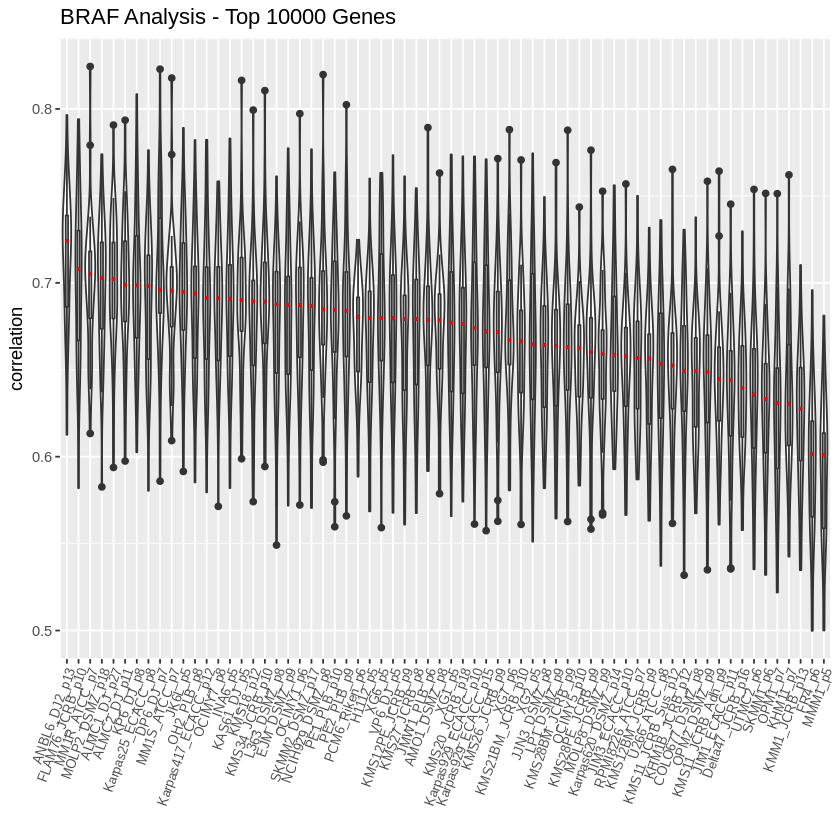

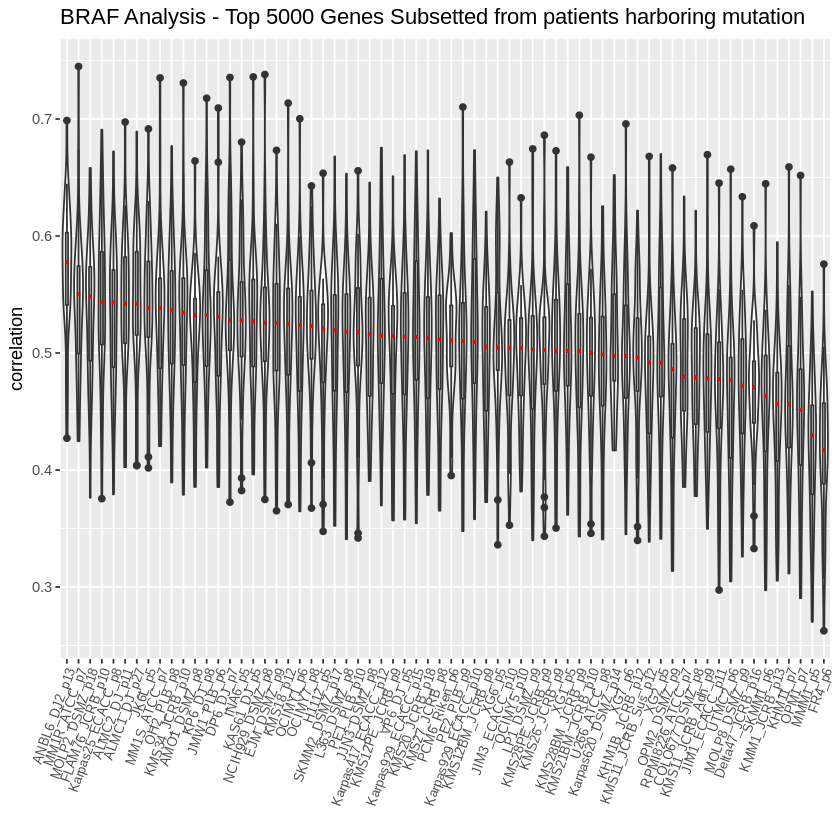

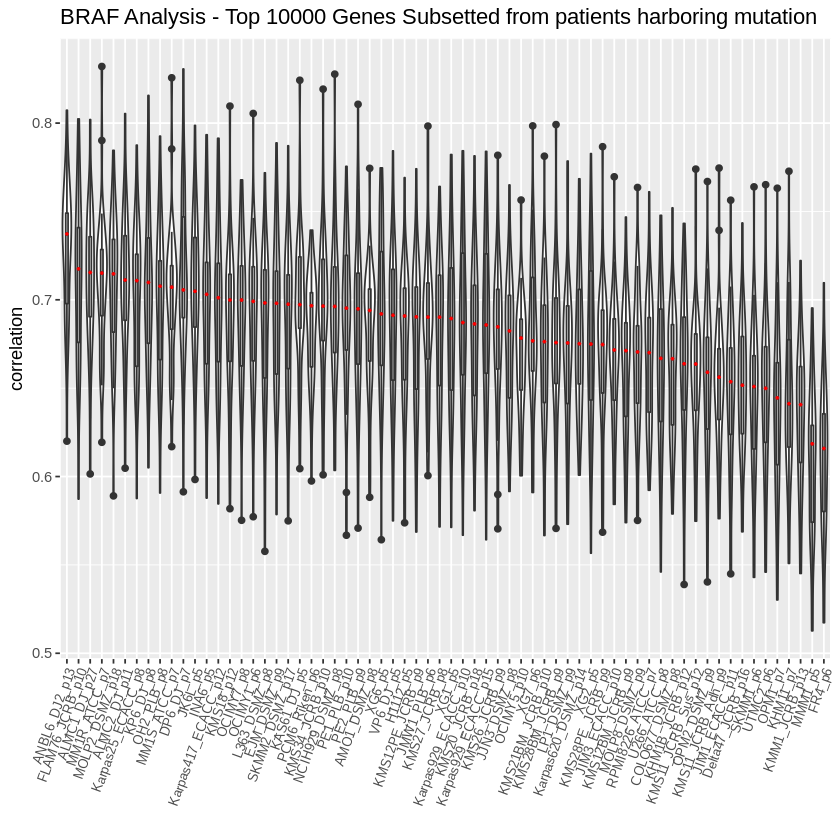

In [20]:
# extracting patients with BRAF mutation who are also newly diagnosed

BRAF_mut = filter(MM_pat_mut, GENE == "BRAF") %>%
  select(sample, EFFECT, HGVS_P, FEATURE) %>%
  filter(EFFECT == "missense_variant") %>%
  mutate(position = str_extract(HGVS_P, "[0-9]+")) %>%
  filter(position %in% c(600))

MM_pat_mut_BRAF = unique(BRAF_mut$sample)
keepcBRAF = colnames(MM_patients) %in% MM_pat_mut_BRAF

# subsetting norm_pat to those patients with mutation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_BRAF = norm_pat[,keepcBRAF]
norm_combined_BRAF = cbind(norm_cell, norm_pat_BRAF)
norm_combined_BRAF_5000 = norm_combined_BRAF[keepi5000, ]
norm_combined_BRAF_10000 = norm_combined_BRAF[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

makeplots(norm_combined_BRAF, colnames(norm_pat_BRAF), 'BRAF Analysis - All Genes')
makeplots(norm_combined_BRAF_5000, colnames(norm_pat_BRAF), 'BRAF Analysis - Top 5000 Genes')
makeplots(norm_combined_BRAF_10000, colnames(norm_pat_BRAF), 'BRAF Analysis - Top 10000 Genes')

# determining top 5000 / 10000 genes from only patients that have 14;16 transloation

keepi_BRAF = apply(norm_pat_BRAF, 1, IQR)
keepis_BRAF = sort(keepi_BRAF, decreasing = TRUE)
keepi_BRAF_5000 = keepi_BRAF %in% keepis_BRAF[1:5000]
keepi_BRAF_10000 = keepi_BRAF %in% keepis_BRAF[1:10000]

# subsetting norm_pat to keep newly filtered genes

norm_combined_BRAF_u_5000 = norm_combined_BRAF[keepi_BRAF_5000, ]
norm_combined_BRAF_u_10000 = norm_combined_BRAF[keepi_BRAF_10000, ]

# plots using newly filtered genes

makeplots(norm_combined_BRAF_u_5000, colnames(norm_pat_BRAF), 'BRAF Analysis - Top 5000 Genes Subsetted from patients harboring mutation')
makeplots(norm_combined_BRAF_u_10000, colnames(norm_pat_BRAF), 'BRAF Analysis - Top 10000 Genes Subsetted from patients harboring mutation')

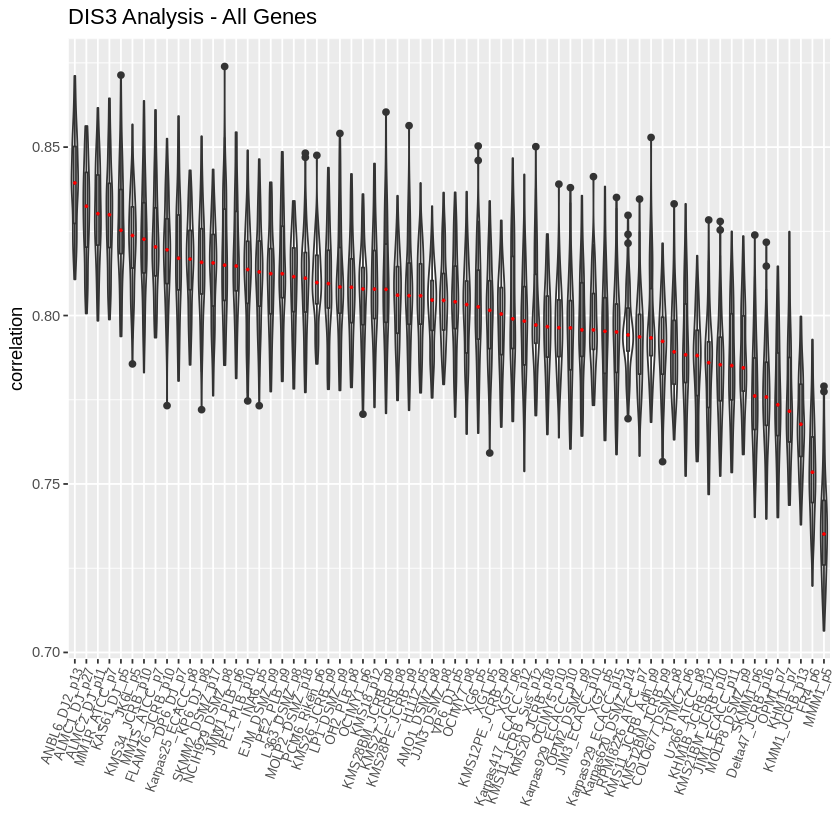

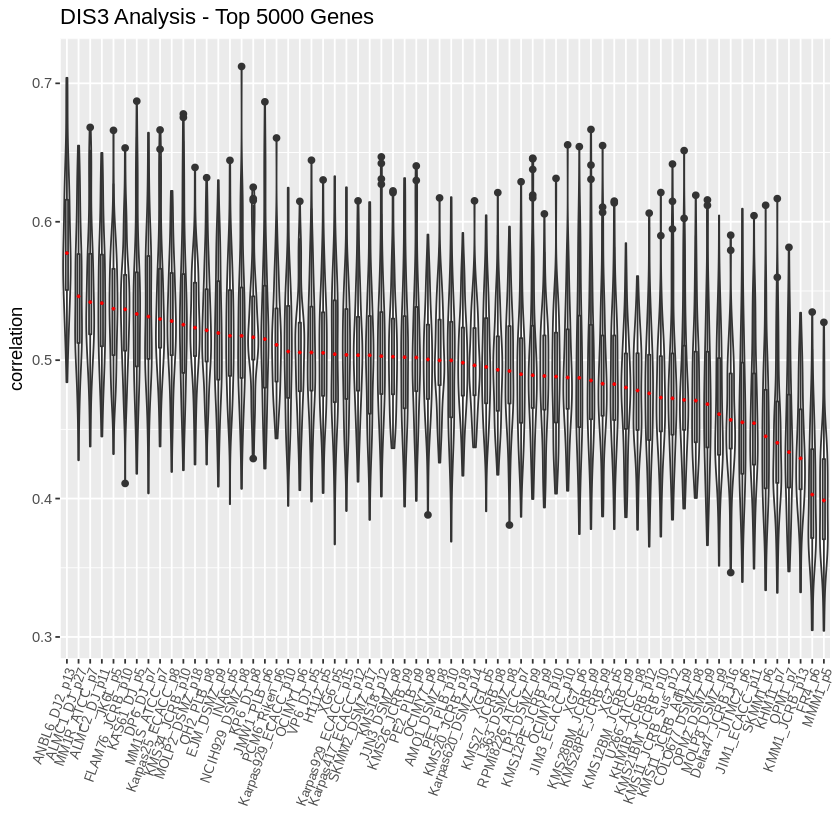

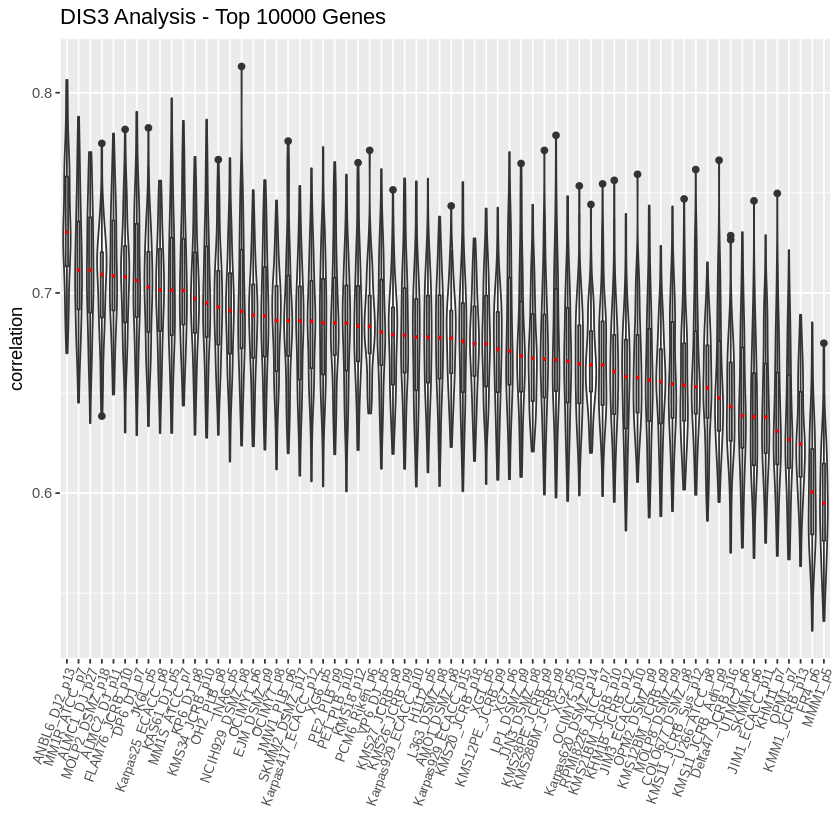

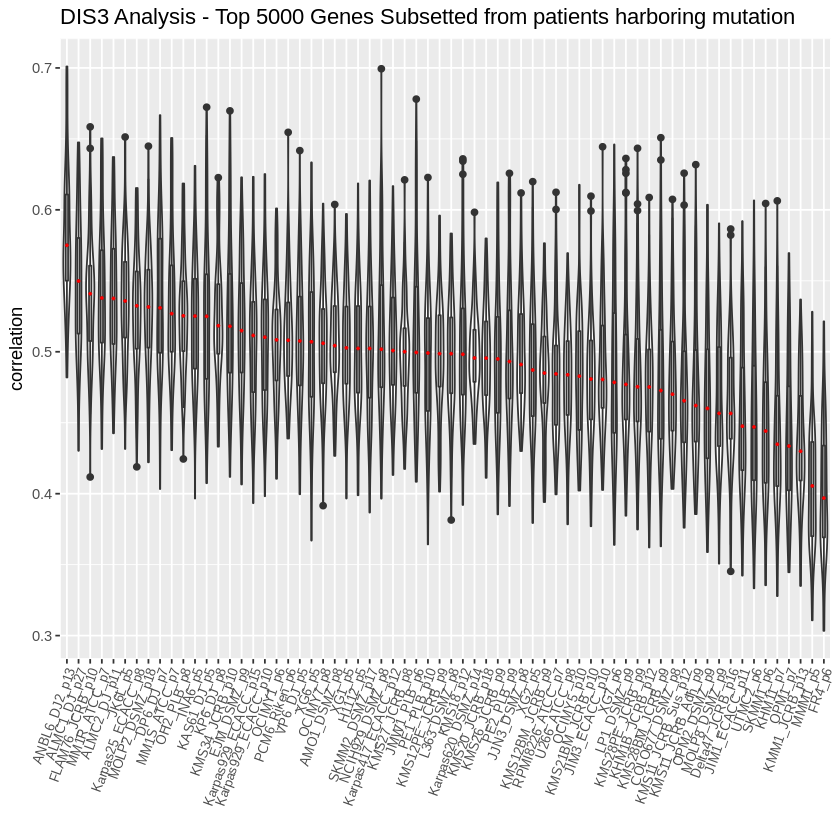

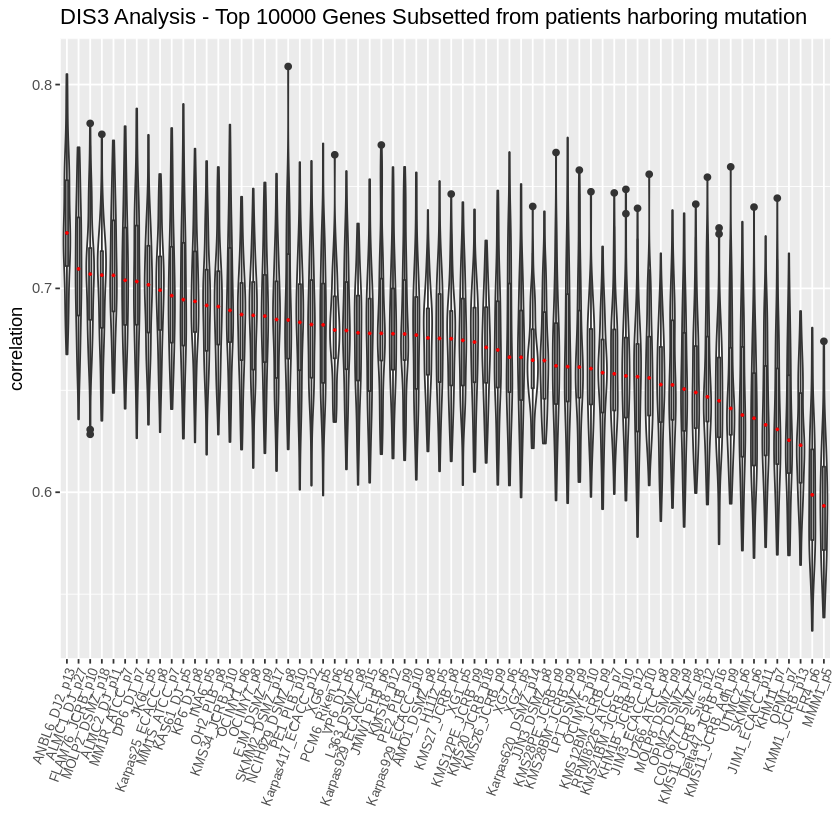

In [21]:
# extracting patients with DIS3 mutation who are also newly diagnosed

DIS3_mut = filter(MM_pat_mut, EFFECT %in% c("missense_variant",
                                         "frameshift_variant",
                                         "stop_gained",
                                         "start_lost",
                                         "stop_lost",
                                         "missense_variant&splice_region_variant",
                                         "frameshift_variant&splice_region_variant",
                                         "disruptive_inframe_deletion",
                                         "stop_gained&splice_region_variant",
                                         "frameshift_variant&stop_gained",
                                         "frameshift_variant&splice_acceptor_variant&splice_region_variant&intron_variant",
                                         "frameshift_variant&splice_donor_variant&splice_region_variant&intron_variant",
                                         "splice_donor_variant&disruptive_inframe_deletion&splice_region_variant&intron_variant",
                                         "stop_lost&splice_region_variant",
                                         "disruptive_inframe_insertion",
                                         "stop_gained&disruptive_inframe_deletion",
                                         "frameshift_variant&start_lost",
                                         "stop_gained&disruptive_inframe_insertion",
                                         "disruptive_inframe_deletion&splice_region_variant",
                                         "disruptive_inframe_insertion&splice_region_variant",
                                         "start_lost&splice_region_variant",
                                         "start_lost&inframe_deletion",
                                         "frameshift_variant&stop_lost",
                                         "splice_acceptor_variant&disruptive_inframe_deletion&splice_region_variant&intron_variant",
                                         "stop_lost&inframe_deletion")) %>%
  filter(str_extract(sample, "_[0-9]_") == "_1_")  %>%
  filter(GENE == 'DIS3')

MM_pat_mut_DIS3 = unique(DIS3_mut$sample)
keepcDIS3 = colnames(MM_patients) %in% MM_pat_mut_DIS3

# subsetting norm_pat to those patients with mutation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_DIS3 = norm_pat[,keepcDIS3]
norm_combined_DIS3 = cbind(norm_cell, norm_pat_DIS3)
norm_combined_DIS3_5000 = norm_combined_DIS3[keepi5000, ]
norm_combined_DIS3_10000 = norm_combined_DIS3[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

makeplots(norm_combined_DIS3, colnames(norm_pat_DIS3), 'DIS3 Analysis - All Genes')
makeplots(norm_combined_DIS3_5000, colnames(norm_pat_DIS3), 'DIS3 Analysis - Top 5000 Genes')
makeplots(norm_combined_DIS3_10000, colnames(norm_pat_DIS3), 'DIS3 Analysis - Top 10000 Genes')

# determining top 5000 / 10000 genes from only patients that have 14;16 transloation

keepi_DIS3 = apply(norm_pat_DIS3, 1, IQR)
keepis_DIS3 = sort(keepi_DIS3, decreasing = TRUE)
keepi_DIS3_5000 = keepi_DIS3 %in% keepis_DIS3[1:5000]
keepi_DIS3_10000 = keepi_DIS3 %in% keepis_DIS3[1:10000]

# subsetting norm_pat to keep newly filtered genes

norm_combined_DIS3_u_5000 = norm_combined_DIS3[keepi_DIS3_5000, ]
norm_combined_DIS3_u_10000 = norm_combined_DIS3[keepi_DIS3_10000, ]

# plots using newly filtered genes

makeplots(norm_combined_DIS3_u_5000, colnames(norm_pat_DIS3), 'DIS3 Analysis - Top 5000 Genes Subsetted from patients harboring mutation')
makeplots(norm_combined_DIS3_u_10000, colnames(norm_pat_DIS3), 'DIS3 Analysis - Top 10000 Genes Subsetted from patients harboring mutation')

[1] 88

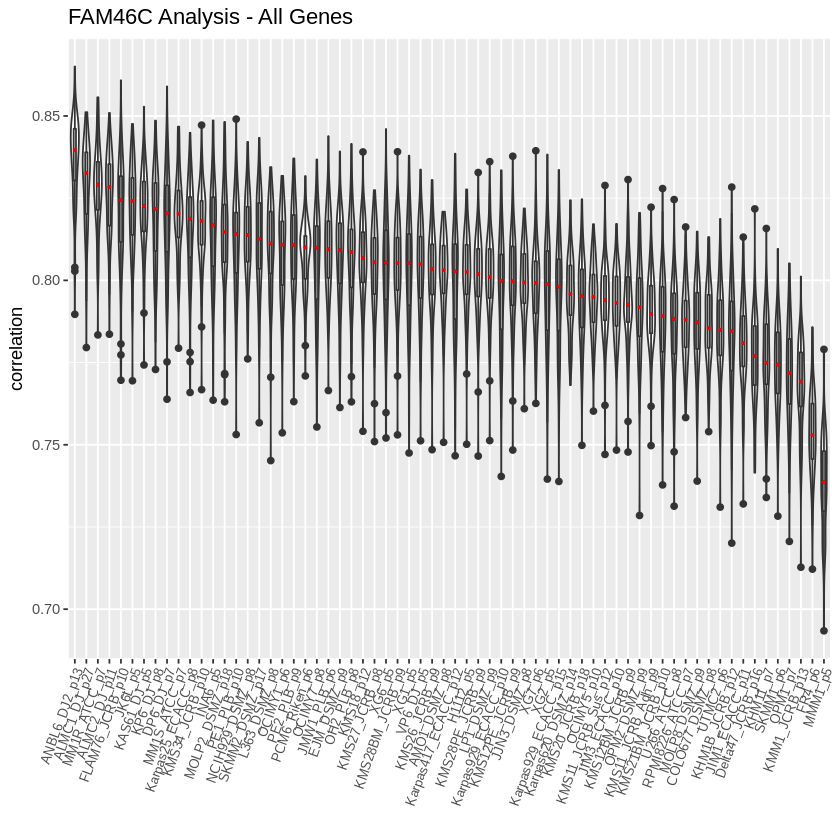

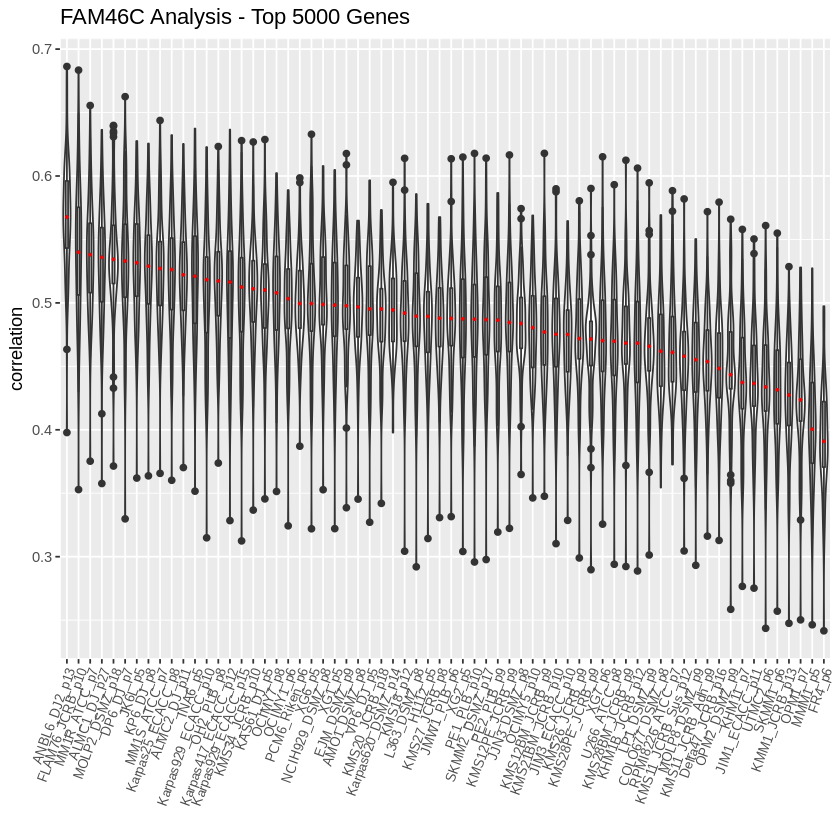

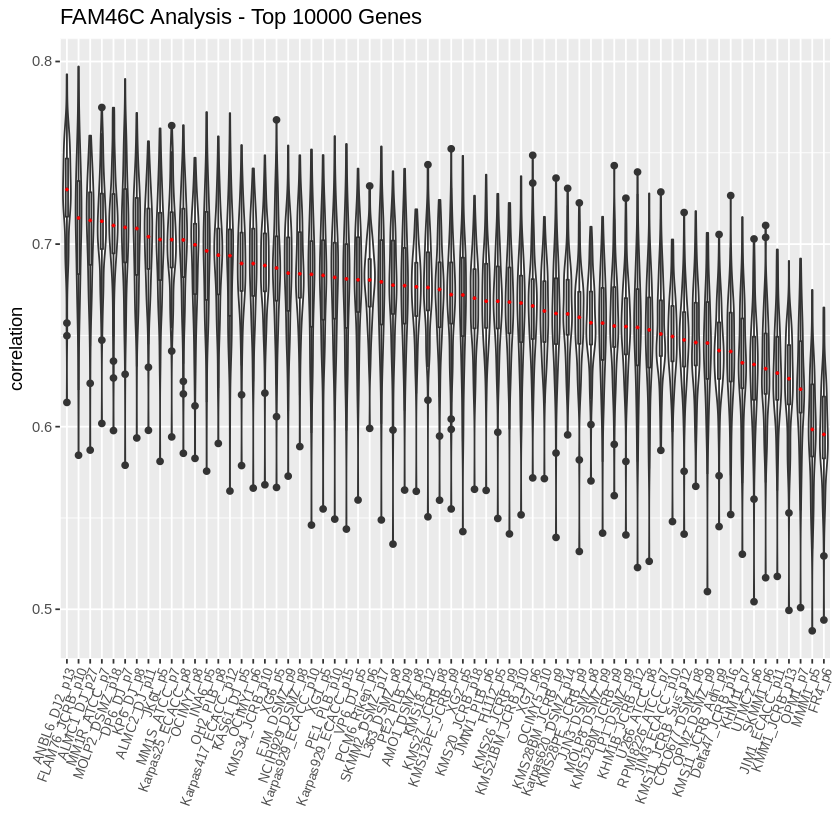

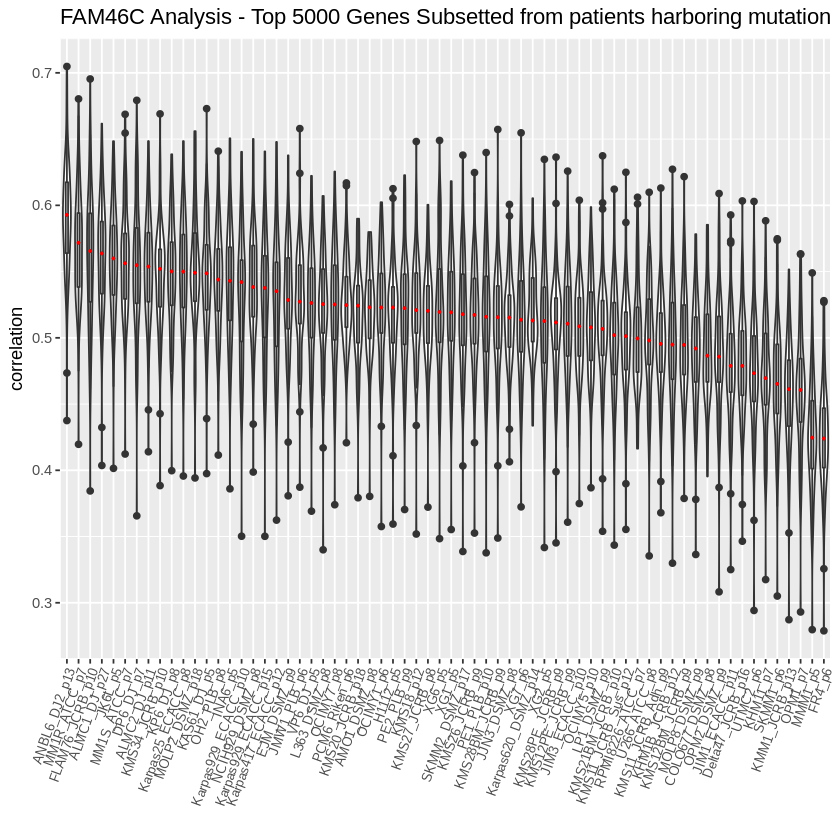

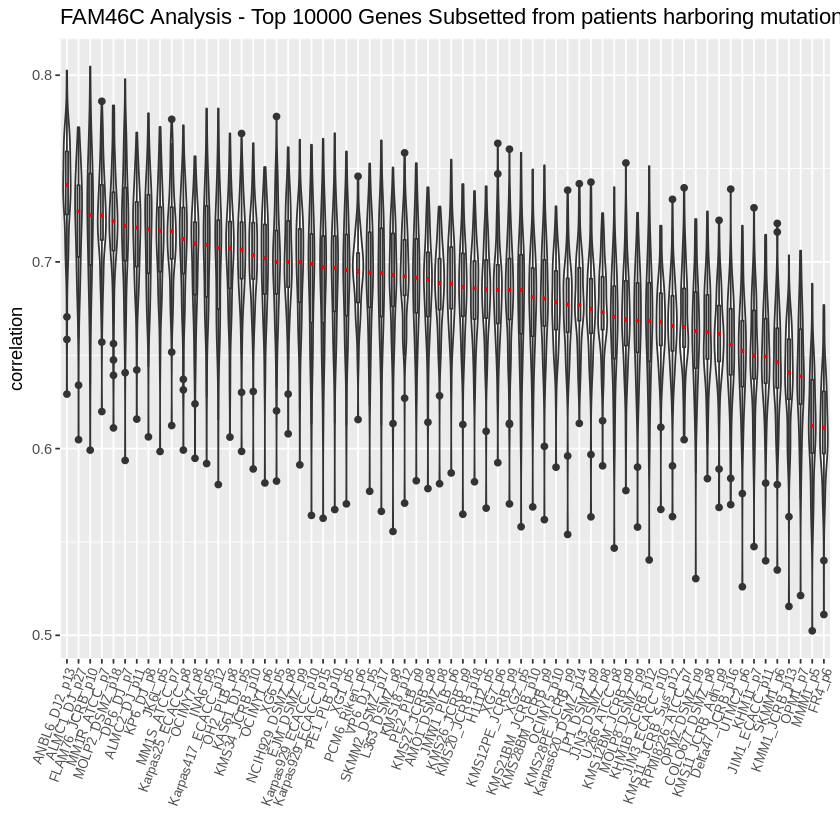

In [22]:
# extracting patients with FAM46C mutation who are also newly diagnosed

FAM46C_mut = filter(MM_pat_mut, EFFECT %in% c("missense_variant",
                                         "frameshift_variant",
                                         "stop_gained",
                                         "start_lost",
                                         "stop_lost",
                                         "missense_variant&splice_region_variant",
                                         "frameshift_variant&splice_region_variant",
                                         "disruptive_inframe_deletion",
                                         "stop_gained&splice_region_variant",
                                         "frameshift_variant&stop_gained",
                                         "frameshift_variant&splice_acceptor_variant&splice_region_variant&intron_variant",
                                         "frameshift_variant&splice_donor_variant&splice_region_variant&intron_variant",
                                         "splice_donor_variant&disruptive_inframe_deletion&splice_region_variant&intron_variant",
                                         "stop_lost&splice_region_variant",
                                         "disruptive_inframe_insertion",
                                         "stop_gained&disruptive_inframe_deletion",
                                         "frameshift_variant&start_lost",
                                         "stop_gained&disruptive_inframe_insertion",
                                         "disruptive_inframe_deletion&splice_region_variant",
                                         "disruptive_inframe_insertion&splice_region_variant",
                                         "start_lost&splice_region_variant",
                                         "start_lost&inframe_deletion",
                                         "frameshift_variant&stop_lost",
                                         "splice_acceptor_variant&disruptive_inframe_deletion&splice_region_variant&intron_variant",
                                         "stop_lost&inframe_deletion")) %>%
  filter(str_extract(sample, "_[0-9]_") == "_1_")  %>%
  filter(GENE == 'FAM46C')

MM_pat_mut_FAM46C = unique(FAM46C_mut$sample)
length(MM_pat_mut_FAM46C)
keepcFAM46C = colnames(MM_patients) %in% MM_pat_mut_FAM46C

# subsetting norm_pat to those patients with mutation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_FAM46C = norm_pat[,keepcFAM46C]
norm_combined_FAM46C = cbind(norm_cell, norm_pat_FAM46C)
norm_combined_FAM46C_5000 = norm_combined_FAM46C[keepi5000, ]
norm_combined_FAM46C_10000 = norm_combined_FAM46C[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

makeplots(norm_combined_FAM46C, colnames(norm_pat_FAM46C), 'FAM46C Analysis - All Genes')
makeplots(norm_combined_FAM46C_5000, colnames(norm_pat_FAM46C), 'FAM46C Analysis - Top 5000 Genes')
makeplots(norm_combined_FAM46C_10000, colnames(norm_pat_FAM46C), 'FAM46C Analysis - Top 10000 Genes')

# determining top 5000 / 10000 genes from only patients that have fam46C MUTATION

keepi_FAM46C = apply(norm_pat_FAM46C, 1, IQR)
keepis_FAM46C = sort(keepi_FAM46C, decreasing = TRUE)
keepi_FAM46C_5000 = keepi_FAM46C %in% keepis_FAM46C[1:5000]
keepi_FAM46C_10000 = keepi_FAM46C %in% keepis_FAM46C[1:10000]

# subsetting norm_pat to keep newly filtered genes

norm_combined_FAM46C_u_5000 = norm_combined_FAM46C[keepi_FAM46C_5000, ]
norm_combined_FAM46C_u_10000 = norm_combined_FAM46C[keepi_FAM46C_10000, ]

# plots using newly filtered genes

makeplots(norm_combined_FAM46C_u_5000, colnames(norm_pat_FAM46C), 'FAM46C Analysis - Top 5000 Genes Subsetted from patients harboring mutation')
makeplots(norm_combined_FAM46C_u_10000, colnames(norm_pat_FAM46C), 'FAM46C Analysis - Top 10000 Genes Subsetted from patients harboring mutation')

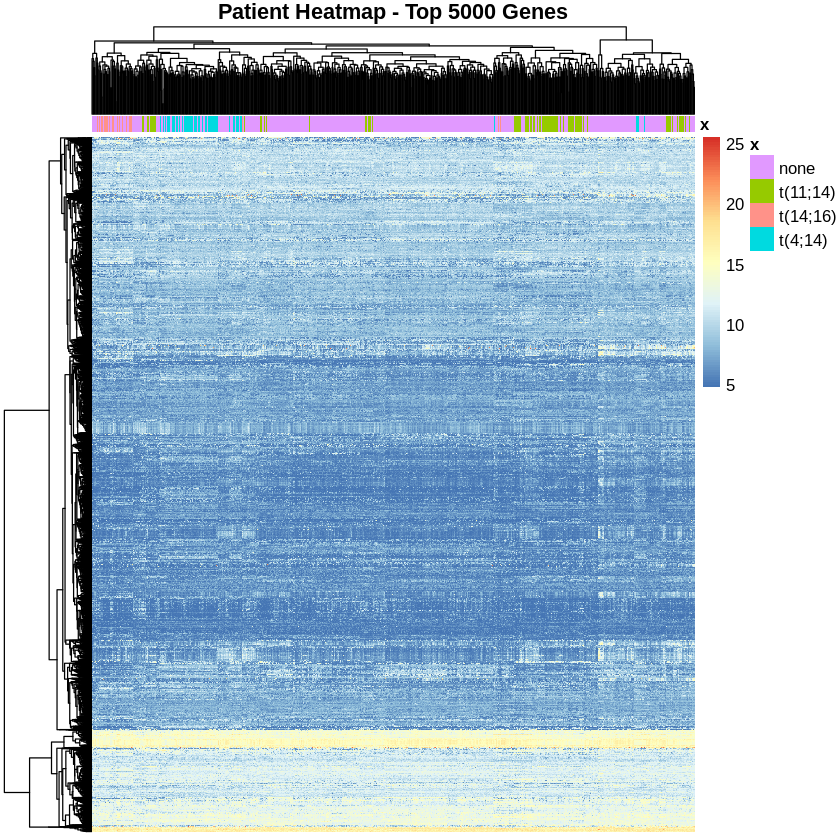

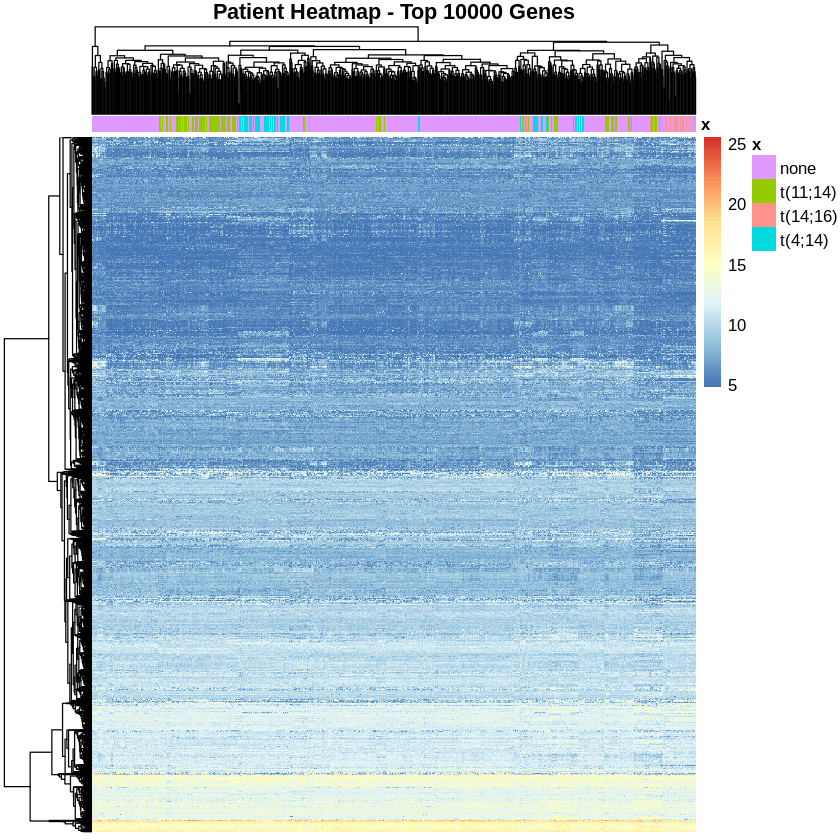

In [23]:
# making patient annotations for heatmap

x = c()

pat_names = colnames(norm_pat)

for(pat in pat_names){
    if (pat %in% colnames(norm_pat_1114)){
        x = append(x, 't(11;14)')
    }
    else if (pat %in% colnames(norm_pat_1416)){
        x = append(x, 't(14;16)')
    }
    else if (pat %in% colnames(norm_pat_414)){
        x = append(x, 't(4;14)')
    }
    else{
        x = append(x, 'none')
    }
}

x = as.data.frame(x)
rownames(x) = colnames(norm_pat)

# subsetting top 5000 / 10000 ggenes for patient heatmap

norm_pat_hm_5000 = norm_pat[keepi5000,] 
norm_pat_hm_10000 = norm_pat[keepi10000,] 

# generating heatmaps

pheatmap(norm_pat_hm_5000, annotation_col = x, show_rownames = FALSE, show_colnames = FALSE, main = 'Patient Heatmap - Top 5000 Genes')
pheatmap(norm_pat_hm_10000, annotation_col = x, show_rownames = FALSE, show_colnames = FALSE, main = 'Patient Heatmap - Top 10000 Genes')

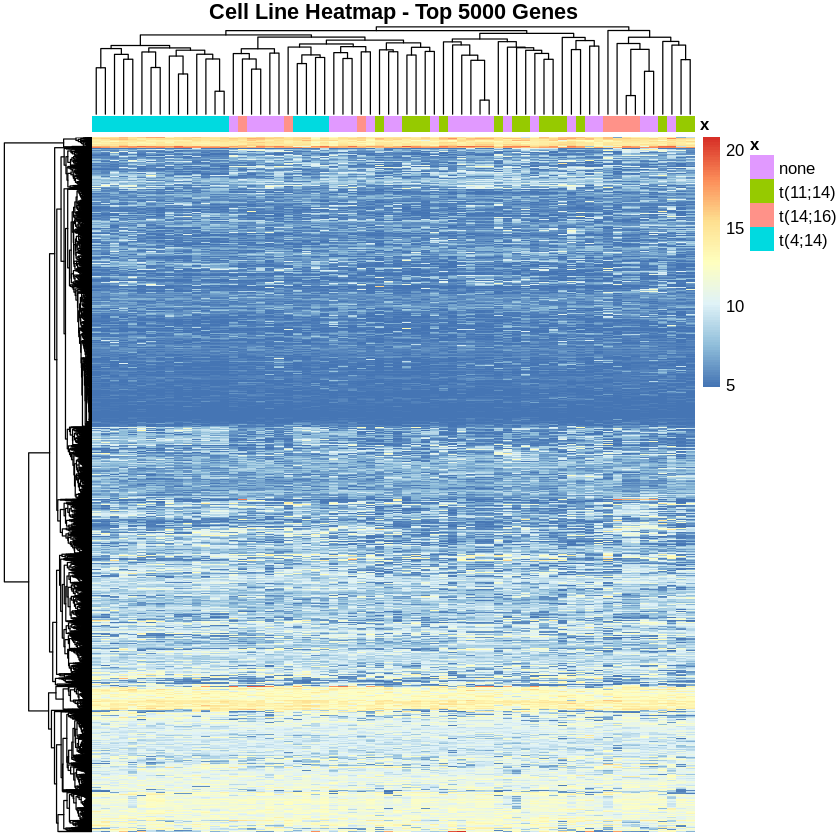

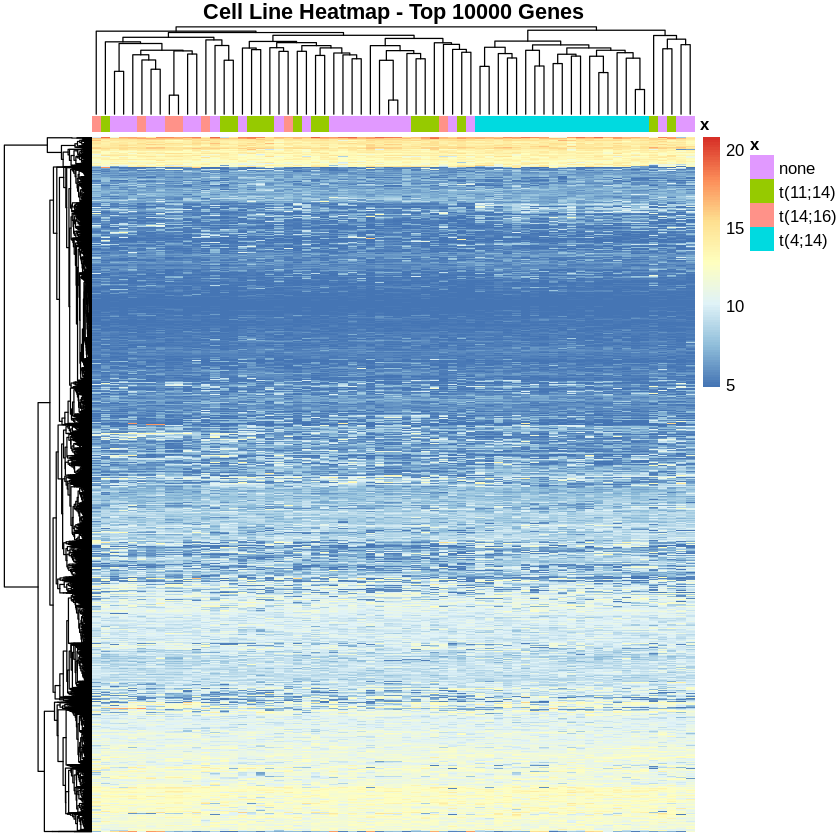

In [24]:
# making cell line annotations for heatmap

cell_names = colnames(MM_cell_line)

x = c('none', 'none', 'none', 't(14;16)', 'none', 'none', 'none', 'none', 
      't(11;14)', 'none', 't(11;14)', 't(11;14)', 't(4;14)', 't(4;14)', 't(14;16)', 'none',
     't(4;14)', 'none', 'none', 't(11;14)', 'none', 'none', 't(4;14)', 't(4;14)', 'none', 'none',
     't(4;14)', 't(4;14)', 't(11;14)', 't(11;14)', 't(4;14)', 'none', 't(11;14)', 't(4;14)', 't(11;14)',
     't(4;14)', 't(4;14)', 't(4;14)', 'none', 'none', 't(4;14)', 't(14;16)', 't(14;16)', 't(11;14)', 'none', 
      't(11;14)', 't(4;14)', 'none', 't(14;16)', 't(11;14)', 'none', 't(4;14)', 't(4;14)', 't(14;16)',
     't(11;14)', 't(4;14)', 'none', 'none', 't(11;14)', 't(11;14)', 't(4;14)', 't(14;16)', 't(11;14)', 'none', 
     'none', 't(4;14)')

x = as.data.frame(x)
rownames(x) = colnames(MM_cell_line)

# subsetting top 5000 / 10000 ggenes for patient heatmap

norm_cells_hm_5000 = norm_cell[keepi5000,]
norm_cells_hm_10000 = norm_cell[keepi10000,]

# generating heatmaps

pheatmap(norm_cells_hm_5000, annotation_col = x, show_rownames = FALSE, show_colnames = FALSE, main = 'Cell Line Heatmap - Top 5000 Genes')
pheatmap(norm_cells_hm_10000, annotation_col = x, show_rownames = FALSE, show_colnames = FALSE, main = 'Cell Line Heatmap - Top 10000 Genes')

In [25]:
cor2check = cor(norm_combined_5000, method = 's')
head(cor2check)

,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ALMC1_DJ_p27,1.0000000,0.8805543,0.6609546,0.8378547,0.7245722,0.6196183,0.7282441,0.7788833,0.7237444,0.6392978,⋯,0.4933652,0.5608761,0.5295802,0.5410907,0.5011998,0.4615494,0.4826397,0.5674340,0.5677463,0.4909093
ALMC2_DJ_p11,0.8805543,1.0000000,0.6965940,0.8212237,0.7300516,0.6733004,0.7572519,0.7803343,0.7241273,0.6482803,⋯,0.5030934,0.5449484,0.5057200,0.5184882,0.4956884,0.4409726,0.5019886,0.5493966,0.5574249,0.4650666
AMO1_DSMZ_p8,0.6609546,0.6965940,1.0000000,0.7046144,0.7022450,0.6754221,0.7172928,0.6837732,0.6494910,0.7097921,⋯,0.4617705,0.4862120,0.5037828,0.5159635,0.4900506,0.4383311,0.4448761,0.5099458,0.5302259,0.4479705
ANBL6_DJ2_p13,0.8378547,0.8212237,0.7046144,1.0000000,0.7454699,0.6287094,0.7471954,0.7971106,0.7274122,0.6223820,⋯,0.5302751,0.5576177,0.5747904,0.5828614,0.5452453,0.4989375,0.5341686,0.5867033,0.5985728,0.5124632
COLO677_DSMZ_p8,0.7245722,0.7300516,0.7022450,0.7454699,1.0000000,0.6366578,0.6643708,0.6968655,0.6713107,0.6762673,⋯,0.4302207,0.4595897,0.4626344,0.4758554,0.4696209,0.3884765,0.4160818,0.4894215,0.4917832,0.4297638
Delta47_JCRB_p16,0.6196183,0.6733004,0.6754221,0.6287094,0.6366578,1.0000000,0.6824999,0.6473087,0.6169356,0.6983876,⋯,0.4118112,0.4574231,0.4699077,0.4776275,0.4221748,0.4077812,0.4445880,0.4707260,0.5020782,0.4271368


In [26]:
head(rownames(cor2check))
head(colnames(cor2check))

[1] "ALMC1_DJ_p27"     "ALMC2_DJ_p11"     "AMO1_DSMZ_p8"     "ANBL6_DJ2_p13"   
[5] "COLO677_DSMZ_p8"  "Delta47_JCRB_p16"

[1] "ALMC1_DJ_p27"     "ALMC2_DJ_p11"     "AMO1_DSMZ_p8"     "ANBL6_DJ2_p13"   
[5] "COLO677_DSMZ_p8"  "Delta47_JCRB_p16"

In [27]:
cor2check['COLO677_DSMZ_p8', 'MMRF_2801_1_BM' ]
cor2check['MMRF_2801_1_BM','COLO677_DSMZ_p8' ]

[1] 0.4629237

[1] 0.4629237

In [28]:
#cell_names
il6_cells = c('ALMC1_DJ_p27','ALMC2_DJ_p11','ANBL6_DJ2_p13','DP6_DJ_p7','INA6_p5','JK6L_p5','JMW1_PLB_p6','KAS61_DJ_p5'
,'KP6_DJ_p8','OH2_PLB_p8','PCM6_Riken_p6','PE1_PLB_p10','PE2_PLB_p9','VP6_DJ_p5','XG1_p5','XG2_p5','XG6_p5'
,'XG7_p6')
cells_bool = colnames(norm_combined_5000) %in% colnames(norm_cell)
il6_bool = colnames(norm_combined_5000) %in% il6_cells
il6_flip = !il6_bool
head(il6_flip)

[1] FALSE FALSE  TRUE FALSE  TRUE  TRUE

In [29]:
cor_nil6_col = cor2check[,il6_flip]
cor_il6 = cor2check[, il6_bool]
head(cor_nil6_col)
head(cor_il6)

,AMO1_DSMZ_p8,COLO677_DSMZ_p8,Delta47_JCRB_p16,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,H1112_p5,JIM1_ECACC_p11,JIM3_ECACC_p10,JJN3_DSMZ_p8,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ALMC1_DJ_p27,0.6609546,0.7245722,0.6196183,0.7788833,0.7237444,0.6392978,0.7297035,0.6840029,0.6901298,0.7303407,⋯,0.4933652,0.5608761,0.5295802,0.5410907,0.5011998,0.4615494,0.4826397,0.5674340,0.5677463,0.4909093
ALMC2_DJ_p11,0.6965940,0.7300516,0.6733004,0.7803343,0.7241273,0.6482803,0.7520602,0.7269605,0.7379925,0.7613786,⋯,0.5030934,0.5449484,0.5057200,0.5184882,0.4956884,0.4409726,0.5019886,0.5493966,0.5574249,0.4650666
AMO1_DSMZ_p8,1.0000000,0.7022450,0.6754221,0.6837732,0.6494910,0.7097921,0.7229638,0.7118024,0.7456390,0.7203734,⋯,0.4617705,0.4862120,0.5037828,0.5159635,0.4900506,0.4383311,0.4448761,0.5099458,0.5302259,0.4479705
ANBL6_DJ2_p13,0.7046144,0.7454699,0.6287094,0.7971106,0.7274122,0.6223820,0.7343609,0.6841862,0.7053714,0.7489003,⋯,0.5302751,0.5576177,0.5747904,0.5828614,0.5452453,0.4989375,0.5341686,0.5867033,0.5985728,0.5124632
COLO677_DSMZ_p8,0.7022450,1.0000000,0.6366578,0.6968655,0.6713107,0.6762673,0.6962504,0.6729712,0.6976852,0.7108825,⋯,0.4302207,0.4595897,0.4626344,0.4758554,0.4696209,0.3884765,0.4160818,0.4894215,0.4917832,0.4297638
Delta47_JCRB_p16,0.6754221,0.6366578,1.0000000,0.6473087,0.6169356,0.6983876,0.6821241,0.6873591,0.6736968,0.6491597,⋯,0.4118112,0.4574231,0.4699077,0.4776275,0.4221748,0.4077812,0.4445880,0.4707260,0.5020782,0.4271368


,ALMC1_DJ_p27,ALMC2_DJ_p11,ANBL6_DJ2_p13,DP6_DJ_p7,INA6_p5,JK6L_p5,JMW1_PLB_p6,KAS61_DJ_p5,KP6_DJ_p8,OH2_PLB_p8,PCM6_Riken_p6,PE1_PLB_p10,PE2_PLB_p9,VP6_DJ_p5,XG1_p5,XG2_p5,XG6_p5,XG7_p6
ALMC1_DJ_p27,1.0000000,0.8805543,0.8378547,0.7282441,0.7184240,0.7183368,0.7278132,0.7907423,0.7149709,0.7321231,0.7053524,0.7302033,0.7441257,0.7304169,0.6798773,0.7040329,0.6979985,0.6893625
ALMC2_DJ_p11,0.8805543,1.0000000,0.8212237,0.7572519,0.7571787,0.7585938,0.7506594,0.7960224,0.7593927,0.7712346,0.7460004,0.7654388,0.7585744,0.7524622,0.7148159,0.7336372,0.7392921,0.7355304
AMO1_DSMZ_p8,0.6609546,0.6965940,0.7046144,0.7172928,0.6954091,0.7532380,0.6973080,0.6890631,0.7298994,0.6983520,0.6975146,0.6902587,0.7012608,0.7323399,0.7021602,0.7204697,0.6642786,0.7038949
ANBL6_DJ2_p13,0.8378547,0.8212237,1.0000000,0.7471954,0.7121501,0.7386524,0.7351117,0.7648449,0.7424503,0.7457476,0.7633322,0.7130450,0.7348187,0.7651424,0.7018450,0.7201949,0.7067793,0.6850693
COLO677_DSMZ_p8,0.7245722,0.7300516,0.7454699,0.6643708,0.6657314,0.6886727,0.6357531,0.7168364,0.6514601,0.6794990,0.6832146,0.6290103,0.6599877,0.7227056,0.6482312,0.6651789,0.6475427,0.6633116
Delta47_JCRB_p16,0.6196183,0.6733004,0.6287094,0.6824999,0.7058203,0.6734406,0.5836963,0.6464437,0.6466473,0.6622826,0.6000231,0.6863307,0.6384977,0.6828777,0.6608512,0.7086483,0.6567358,0.6887692


In [30]:
cor_cells = cor2check[, cell_bool]
cor_nil6_bool = !(colnames(cor_cells) %in% colnames(cor_il6))
cor_nil6 = cor_cells[, cor_nil6_bool]
head(cor_nil6)

,AMO1_DSMZ_p8,COLO677_DSMZ_p8,Delta47_JCRB_p16,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,H1112_p5,JIM1_ECACC_p11,JIM3_ECACC_p10,JJN3_DSMZ_p8,⋯,OCIMY1_p6,OCIMY5_p10,OCIMY7_p8,OPM1_p7,OPM2_DSMZ_p9,RPMI8226_ATCC_p7,SKMM1_p6,SKMM2_DSMZ_p17,U266_ATCC_p8,UTMC2_p6
ALMC1_DJ_p27,0.6609546,0.7245722,0.6196183,0.7788833,0.7237444,0.6392978,0.7297035,0.6840029,0.6901298,0.7303407,⋯,0.6869417,0.6867198,0.6211101,0.6980314,0.7243376,0.7477338,0.6950981,0.7387548,0.6424892,0.7001388
ALMC2_DJ_p11,0.6965940,0.7300516,0.6733004,0.7803343,0.7241273,0.6482803,0.7520602,0.7269605,0.7379925,0.7613786,⋯,0.7022548,0.6933879,0.6788888,0.7175792,0.7484775,0.7446591,0.7246969,0.7704852,0.6672172,0.7173670
AMO1_DSMZ_p8,1.0000000,0.7022450,0.6754221,0.6837732,0.6494910,0.7097921,0.7229638,0.7118024,0.7456390,0.7203734,⋯,0.7569684,0.6919390,0.6943831,0.6862067,0.7026431,0.6647882,0.7087612,0.6944454,0.7156309,0.6524835
ANBL6_DJ2_p13,0.7046144,0.7454699,0.6287094,0.7971106,0.7274122,0.6223820,0.7343609,0.6841862,0.7053714,0.7489003,⋯,0.7089201,0.6970156,0.6549254,0.6957649,0.7076980,0.7405838,0.6785252,0.7187105,0.6732738,0.6643269
COLO677_DSMZ_p8,0.7022450,1.0000000,0.6366578,0.6968655,0.6713107,0.6762673,0.6962504,0.6729712,0.6976852,0.7108825,⋯,0.6806755,0.7263691,0.6002701,0.6650050,0.6579520,0.8758361,0.7031087,0.6851710,0.6494640,0.6282720
Delta47_JCRB_p16,0.6754221,0.6366578,1.0000000,0.6473087,0.6169356,0.6983876,0.6821241,0.6873591,0.6736968,0.6491597,⋯,0.6394558,0.6335773,0.6552116,0.6480292,0.6585179,0.6428438,0.6784598,0.7112456,0.6482141,0.6639344


In [31]:
pat_bool = colnames(norm_combined_10000) %in% colnames(norm_pat)
cor_il6 = cor_il6[pat_bool,]
cor_nil6 = cor_nil6[pat_bool,]
head(rowMeans(cor_il6))

MMRF_2801_1_BM MMRF_2718_1_BM MMRF_2815_1_BM MMRF_1656_1_BM MMRF_2461_1_BM 
     0.4536893      0.4422036      0.4843829      0.5717709      0.4215398 
MMRF_2057_1_BM 
     0.5498710

In [32]:
cor_il6_means = rowMeans(cor_il6)
cor_nil6_means = rowMeans(cor_nil6)
head(cor_il6_means)
head(cor_nil6_means)

MMRF_2801_1_BM MMRF_2718_1_BM MMRF_2815_1_BM MMRF_1656_1_BM MMRF_2461_1_BM 
     0.4536893      0.4422036      0.4843829      0.5717709      0.4215398 
MMRF_2057_1_BM 
     0.5498710

MMRF_2801_1_BM MMRF_2718_1_BM MMRF_2815_1_BM MMRF_1656_1_BM MMRF_2461_1_BM 
     0.4400088      0.4235591      0.4577128      0.5390169      0.3938003 
MMRF_2057_1_BM 
     0.5066211

In [33]:
test = wilcox.test(cor_il6_means, cor_nil6_means)

In [34]:
test


	Wilcoxon rank sum test with continuity correction

data:  cor_il6_means and cor_nil6_means
W = 410470, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0


In [35]:
test2 = wilcox.test(cor_il6_means, cor_nil6_means, alternative = 'g')
test2

test3 = wilcox.test(cor_il6_means, cor_nil6_means, alternative = 'l')
test3


	Wilcoxon rank sum test with continuity correction

data:  cor_il6_means and cor_nil6_means
W = 410470, p-value < 2.2e-16
alternative hypothesis: true location shift is greater than 0



	Wilcoxon rank sum test with continuity correction

data:  cor_il6_means and cor_nil6_means
W = 410470, p-value = 1
alternative hypothesis: true location shift is less than 0


In [36]:
mean(cor_il6_means)

[1] 0.5129789

In [37]:
mean(cor_nil6_means)

[1] 0.4810338

In [38]:
combined_annot = data.frame(colnames(norm_combined))
head(combined_annot)
# combined_annot$type = "Patient"
# combined_annot$type[1:ncol(norm_cell)] = "Cell_Line"
# rn = combined_annot[,1]
# combined_annot = combined_annot[-1]
# rownames(combined_annot) = rn
# set = newSeqExpressionSet(as.matrix(round(MM_combined.filtered)), 
#                           phenoData = combined_annot)
# set = betweenLaneNormalization(set, which="upper")

# x <- as.factor(combined_annot$type)
# design <- model.matrix(~x, data=pData(set))
# y <- DGEList(counts=counts(set), group=x)
# y <- calcNormFactors(y, method="upperquartile")
# y <- estimateGLMCommonDisp(y, design)
# y <- estimateGLMTagwiseDisp(y, design)
# fit <- glmFit(y, design)
# lrt <- glmLRT(fit, coef=2)
# top <- topTags(lrt, n=nrow(set))$table

colnames.norm_combined.
<fct>
ALMC1_DJ_p27
ALMC2_DJ_p11
AMO1_DSMZ_p8
ANBL6_DJ2_p13
COLO677_DSMZ_p8
Delta47_JCRB_p16


In [39]:
combined_annot$type = "Patient"
combined_annot$type[1:ncol(norm_cell)] = "Cell_Line"
tail(combined_annot)
rn = combined_annot[,1]
combined_annot = combined_annot[-1]
rownames(combined_annot) = rn




,colnames.norm_combined.,type
,<fct>,<chr>
840,MMRF_1641_1_BM,Patient
841,MMRF_2795_1_BM,Patient
842,MMRF_2316_1_BM,Patient
843,MMRF_2440_1_BM,Patient
844,MMRF_2731_1_BM,Patient
845,MMRF_1355_1_BM,Patient


In [40]:
set = newSeqExpressionSet(as.matrix(norm_combined), 
                          phenoData = combined_annot)

Warning message in validityMethod(object):
"'counts' contains non-integer numbers"

In [41]:
x <- as.factor(combined_annot$type)
design <- model.matrix(~x, data=pData(set))
y <- DGEList(counts=counts(set), group=x)
y <- calcNormFactors(y, method="upperquartile")
y <- estimateGLMCommonDisp(y, design)
y <- estimateGLMTagwiseDisp(y, design)
fit <- glmFit(y, design)
lrt <- glmLRT(fit, coef=2)
top <- topTags(lrt, n=nrow(set))$table
head(top)

,logFC,logCPM,LR,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000215472,-1.599601,5.388916,787.5075,2.806625e-173,6.303399e-169
ENSG00000256061,-1.350720,5.467159,554.8173,1.127304e-122,1.265907e-118
ENSG00000125740,1.360915,6.620002,516.3322,2.657790e-114,1.989710e-110
ENSG00000145337,-1.229030,5.345795,395.0875,6.461566e-88,3.628008e-84
ENSG00000225339,-1.227788,5.337219,391.0504,4.888731e-87,2.195920e-83
ENSG00000103426,-1.222245,5.336532,386.5457,4.676254e-86,1.750400e-82


In [74]:
length(top$PValue)
pcut = top$PValue < 0.05
sum(pcut)

[1] 22459

[1] 8949

In [75]:
pcut2 = top[pcut,]
head(pcut2)
length(pcut2[,1])

,logFC,logCPM,LR,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000215472,-1.599601,5.388916,787.5075,2.806625e-173,6.303399e-169
ENSG00000256061,-1.350720,5.467159,554.8173,1.127304e-122,1.265907e-118
ENSG00000125740,1.360915,6.620002,516.3322,2.657790e-114,1.989710e-110
ENSG00000145337,-1.229030,5.345795,395.0875,6.461566e-88,3.628008e-84
ENSG00000225339,-1.227788,5.337219,391.0504,4.888731e-87,2.195920e-83
ENSG00000103426,-1.222245,5.336532,386.5457,4.676254e-86,1.750400e-82


[1] 8949

In [78]:
head(top)

,logFC,logCPM,LR,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000215472,-1.599601,5.388916,787.5075,2.806625e-173,6.303399e-169
ENSG00000256061,-1.350720,5.467159,554.8173,1.127304e-122,1.265907e-118
ENSG00000125740,1.360915,6.620002,516.3322,2.657790e-114,1.989710e-110
ENSG00000145337,-1.229030,5.345795,395.0875,6.461566e-88,3.628008e-84
ENSG00000225339,-1.227788,5.337219,391.0504,4.888731e-87,2.195920e-83
ENSG00000103426,-1.222245,5.336532,386.5457,4.676254e-86,1.750400e-82


In [80]:
head(hmgs)
hmgse = read.gmt('h.all.v6.2.entrez.gmt')
head(hmgse)

ont,gene
<fct>,<chr>
HALLMARK_TNFA_SIGNALING_VIA_NFKB,JUNB
HALLMARK_TNFA_SIGNALING_VIA_NFKB,CXCL2
HALLMARK_TNFA_SIGNALING_VIA_NFKB,ATF3
HALLMARK_TNFA_SIGNALING_VIA_NFKB,NFKBIA
HALLMARK_TNFA_SIGNALING_VIA_NFKB,TNFAIP3
HALLMARK_TNFA_SIGNALING_VIA_NFKB,PTGS2


ont,gene
<fct>,<chr>
HALLMARK_TNFA_SIGNALING_VIA_NFKB,3726
HALLMARK_TNFA_SIGNALING_VIA_NFKB,2920
HALLMARK_TNFA_SIGNALING_VIA_NFKB,467
HALLMARK_TNFA_SIGNALING_VIA_NFKB,4792
HALLMARK_TNFA_SIGNALING_VIA_NFKB,7128
HALLMARK_TNFA_SIGNALING_VIA_NFKB,5743


In [82]:
eid = bitr(geneID = rownames(top), fromType = 'ENSEMBL', toType = 'ENTREZID', OrgDb = org.Hs.eg.db)#, drop = TRUE)
head(eid)

'select()' returned 1:many mapping between keys and columns
Warning message in bitr(geneID = rownames(top), fromType = "ENSEMBL", toType = "ENTREZID", :
"18.91% of input gene IDs are fail to map..."

,ENSEMBL,ENTREZID
,<chr>,<chr>
1,ENSG00000215472,100526842
2,ENSG00000256061,161582
3,ENSG00000125740,2354
4,ENSG00000145337,100996939
6,ENSG00000103426,100529144
7,ENSG00000011052,654364


In [83]:
top2 = top
rownames(top2) = eid
head(top2)

ERROR: Error in `.rowNamesDF<-`(x, value = value): invalid 'row.names' length


In [71]:
head(examplePathways)
head(exampleRanks)

$`1221633_Meiotic_Synapsis`
 [1] "12189"     "13006"     "15077"     "15078"     "15270"     "15512"    
 [7] "16905"     "16906"     "19357"     "20842"     "20843"     "20957"    
[13] "20962"     "21749"     "21750"     "22196"     "23856"     "24061"    
[19] "28113"     "50878"     "56739"     "57321"     "64009"     "66654"    
[25] "69386"     "71846"     "74075"     "77053"     "94244"     "97114"    
[31] "97122"     "97908"     "101185"    "140557"    "223697"    "260423"   
[37] "319148"    "319149"    "319150"    "319151"    "319152"    "319153"   
[43] "319154"    "319155"    "319156"    "319157"    "319158"    "319159"   
[49] "319160"    "319161"    "319565"    "320332"    "320558"    "326619"   
[55] "326620"    "360198"    "497652"    "544973"    "625328"    "667250"   
[61] "100041230" "102641229" "102641751" "102642045"

$`1368092_Rora_activates_gene_expression`
[1] "11865"  "12753"  "12894"  "18143"  "19017"  "19883"  "20787"  "217166"
[9] "328572"

$`1368110_Bmal1:Clock,Npas2_activates_circadian_gene_expression`
 [1] "11865"  "11998"  "12753"  "12952"  "12953"  "13170"  "14068"  "18143" 
 [9] "18626"  "18627"  "19013"  "19883"  "20893"  "59027"  "79362"  "217166"

$`1445146_Translocation_of_Glut4_to_the_Plasma_Membrane`
 [1] "11461"     "11465"     "11651"     "11652"     "12313"     "12314"    
 [7] "12315"     "16568"     "16569"     "16579"     "17274"     "17884"    
[13] "17886"     "17913"     "17918"     "19079"     "19082"     "19325"    
[19] "19341"     "20336"     "20528"     "20619"     "20909"     "20912"    
[25] "22318"     "22627"     "22628"     "22629"     "22630"     "22631"    
[31] "53413"     "54401"     "55948"     "56044"     "57915"     "66482"    
[37] "68328"     "68365"     "68938"     "69940"     "102058"    "105504"   
[43] "107371"    "108079"    "108097"    "108099"    "210789"    "211446"   
[49] "240028"    "241113"    "241694"    "100039786" "102634437" "102641200"
[55] "102641764"

$`186574_Endocrine-committed_Ngn3+_progenitor_cells`
[1] "18012" "18088" "18506" "53626"

$`186589_Late_stage_branching_morphogenesis_pancreatic_bud_precursor_cells`
[1] "11925"  "15205"  "21410"  "246086"

170942    109711     18124     12775     72148     16010 
-63.33703 -49.74779 -43.63878 -41.51889 -33.26039 -32.77626

In [42]:
head(combined_annot)
tail(combined_annot)

,type
,<chr>
ALMC1_DJ_p27,Cell_Line
ALMC2_DJ_p11,Cell_Line
AMO1_DSMZ_p8,Cell_Line
ANBL6_DJ2_p13,Cell_Line
COLO677_DSMZ_p8,Cell_Line
Delta47_JCRB_p16,Cell_Line


,type
,<chr>
MMRF_1641_1_BM,Patient
MMRF_2795_1_BM,Patient
MMRF_2316_1_BM,Patient
MMRF_2440_1_BM,Patient
MMRF_2731_1_BM,Patient
MMRF_1355_1_BM,Patient


In [43]:
length(top[,1])

[1] 22459

In [44]:
top_neg_bool = top[,1] < 0
top_pos_bool = !top_neg_bool

head(top_neg_bool)
head(top_pos_bool)

[1]  TRUE  TRUE FALSE  TRUE  TRUE  TRUE

[1] FALSE FALSE  TRUE FALSE FALSE FALSE

In [45]:
cor_il6_cmeans = colMeans(cor_il6)
cor_nil6_cmeans = colMeans(cor_nil6)

head(cor_il6_cmeans)
head(cor_nil6_cmeans)

ALMC1_DJ_p27  ALMC2_DJ_p11 ANBL6_DJ2_p13     DP6_DJ_p7       INA6_p5 
    0.5369961     0.5300274     0.5717817     0.5304374     0.5181444 
      JK6L_p5 
    0.5325068

AMO1_DSMZ_p8  COLO677_DSMZ_p8 Delta47_JCRB_p16      EJM_DSMZ_p9 
       0.5001054        0.4689277        0.4551389        0.5082741 
 FLAM76_JCRB_p10           FR4_p6 
       0.5365279        0.3985122

In [46]:
#cor_il6_cmeans$type = 'IL6 dependent'
head(cor_il6_cmeans)
cor_il6_cmeans2 = as.data.frame(cor_il6_cmeans)
cor_il6_cmeans2$type = 'IL6 dependent'
cor_nil6_cmeans2 = as.data.frame(cor_nil6_cmeans)
cor_nil6_cmeans2$type = 'IL6 independent'

head(cor_nil6_cmeans2)

ALMC1_DJ_p27  ALMC2_DJ_p11 ANBL6_DJ2_p13     DP6_DJ_p7       INA6_p5 
    0.5369961     0.5300274     0.5717817     0.5304374     0.5181444 
      JK6L_p5 
    0.5325068

,cor_nil6_cmeans,type
,<dbl>,<chr>
AMO1_DSMZ_p8,0.5001054,IL6 independent
COLO677_DSMZ_p8,0.4689277,IL6 independent
Delta47_JCRB_p16,0.4551389,IL6 independent
EJM_DSMZ_p9,0.5082741,IL6 independent
FLAM76_JCRB_p10,0.5365279,IL6 independent
FR4_p6,0.3985122,IL6 independent


In [47]:
colnames(cor_il6_cmeans2) = c('cor', 'type')
colnames(cor_nil6_cmeans2) = c('cor', 'type')
cor_il6_bound = rbind(cor_il6_cmeans2, cor_nil6_cmeans2)
head(cor_il6_bound)

,cor,type
,<dbl>,<chr>
ALMC1_DJ_p27,0.5369961,IL6 dependent
ALMC2_DJ_p11,0.5300274,IL6 dependent
ANBL6_DJ2_p13,0.5717817,IL6 dependent
DP6_DJ_p7,0.5304374,IL6 dependent
INA6_p5,0.5181444,IL6 dependent
JK6L_p5,0.5325068,IL6 dependent


In [48]:
library(ggpubr)

Loading required package: magrittr

Attaching package: 'magrittr'

The following object is masked from 'package:ShortRead':

    functions



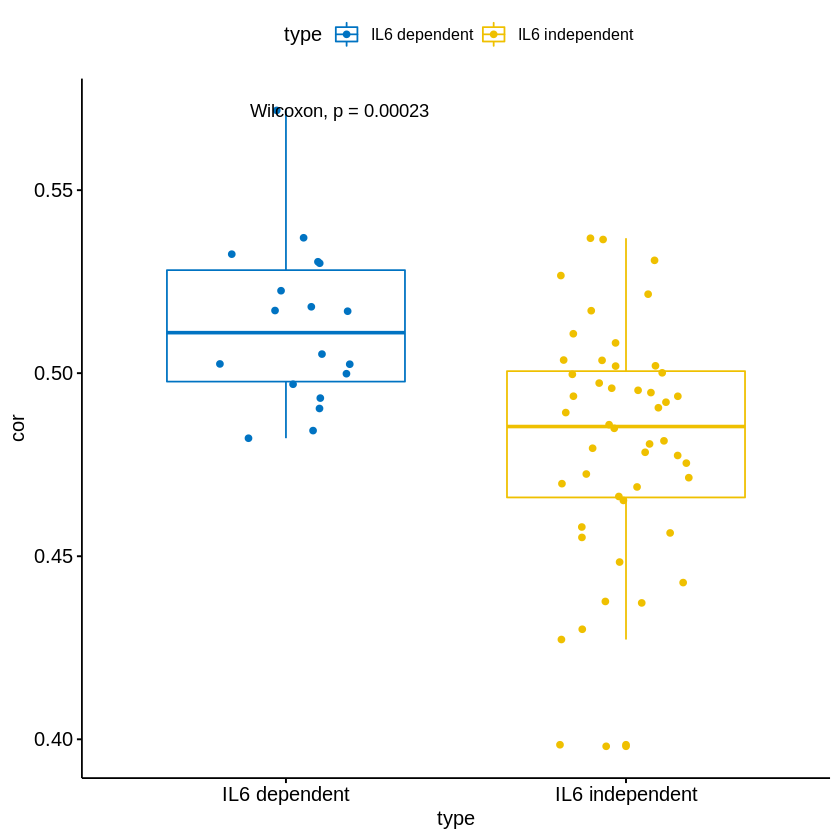

In [49]:
p <- ggboxplot(cor_il6_bound, x = "type", y = "cor",
          color = "type", palette = "jco",
          add = "jitter")
p + stat_compare_means()

In [50]:
test4 = wilcox.test(cor_il6_cmeans, cor_nil6_cmeans)
test4


	Wilcoxon rank sum test

data:  cor_il6_cmeans and cor_nil6_cmeans
W = 688, p-value = 0.0001326
alternative hypothesis: true location shift is not equal to 0


In [51]:
test5 = wilcox.test(cor_il6_cmeans, cor_nil6_cmeans, alternative = 'g')
test5

test6 = wilcox.test(cor_il6_cmeans, cor_nil6_cmeans, alternative = 'l')
test6


	Wilcoxon rank sum test

data:  cor_il6_cmeans and cor_nil6_cmeans
W = 688, p-value = 6.632e-05
alternative hypothesis: true location shift is greater than 0



	Wilcoxon rank sum test

data:  cor_il6_cmeans and cor_nil6_cmeans
W = 688, p-value = 0.9999
alternative hypothesis: true location shift is less than 0


In [52]:
library(clusterProfiler)



clusterProfiler v3.10.1  For help: https://guangchuangyu.github.io/software/clusterProfiler

If you use clusterProfiler in published research, please cite:
Guangchuang Yu, Li-Gen Wang, Yanyan Han, Qing-Yu He. clusterProfiler: an R package for comparing biological themes among gene clusters. OMICS: A Journal of Integrative Biology. 2012, 16(5):284-287.

Attaching package: 'clusterProfiler'

The following object is masked from 'package:DelayedArray':

    simplify



In [53]:
hmgs = read.gmt('h.all.v6.2.symbols.gmt')
head(hmgs)

Loading required package: GSEABase
Loading required package: annotate
Loading required package: AnnotationDbi

Attaching package: 'AnnotationDbi'

The following object is masked from 'package:dplyr':

    select

Loading required package: XML
Loading required package: graph

Attaching package: 'graph'

The following object is masked from 'package:XML':

    addNode

The following object is masked from 'package:stringr':

    boundary

The following object is masked from 'package:Biostrings':

    complement



ont,gene
<fct>,<chr>
HALLMARK_TNFA_SIGNALING_VIA_NFKB,JUNB
HALLMARK_TNFA_SIGNALING_VIA_NFKB,CXCL2
HALLMARK_TNFA_SIGNALING_VIA_NFKB,ATF3
HALLMARK_TNFA_SIGNALING_VIA_NFKB,NFKBIA
HALLMARK_TNFA_SIGNALING_VIA_NFKB,TNFAIP3
HALLMARK_TNFA_SIGNALING_VIA_NFKB,PTGS2


In [54]:
library(org.Hs.eg.db)


In [58]:
library(topGO)

Loading required package: GO.db
Loading required package: SparseM

Attaching package: 'SparseM'

The following object is masked from 'package:base':

    backsolve


groupGOTerms: 	GOBPTerm, GOMFTerm, GOCCTerm environments built.

Attaching package: 'topGO'

The following objects are masked from 'package:GSEABase':

    ontology, phenotype

The following object is masked from 'package:IRanges':

    members



In [59]:
data(geneList)


In [60]:
head(geneList)

1095_s_at   1130_at   1196_at 1329_s_at 1340_s_at 1342_g_at 
1.0000000 1.0000000 0.6223795 0.5412240 1.0000000 1.0000000

In [57]:
ego <- enrichGO(gene          = top,
                universe      = rownames(top),
                OrgDb         = org.Hs.eg.db,
                keyType       = 'ENSEMBL',
                ont           = "CC",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)
head(summary(ego))

--> No gene can be mapped....
--> Expected input gene ID: ENSG00000106290,ENSG00000156983,ENSG00000136518,ENSG00000087152,ENSG00000075624,ENSG00000196363
--> return NULL...


Length  Class   Mode 
     0   NULL   NULL 

In [61]:
library(fgsea)

Loading required package: Rcpp


In [62]:
data(examplePathways)
data(exampleRanks)

head(examplePathways)
head(exampleRanks)

$`1221633_Meiotic_Synapsis`
 [1] "12189"     "13006"     "15077"     "15078"     "15270"     "15512"    
 [7] "16905"     "16906"     "19357"     "20842"     "20843"     "20957"    
[13] "20962"     "21749"     "21750"     "22196"     "23856"     "24061"    
[19] "28113"     "50878"     "56739"     "57321"     "64009"     "66654"    
[25] "69386"     "71846"     "74075"     "77053"     "94244"     "97114"    
[31] "97122"     "97908"     "101185"    "140557"    "223697"    "260423"   
[37] "319148"    "319149"    "319150"    "319151"    "319152"    "319153"   
[43] "319154"    "319155"    "319156"    "319157"    "319158"    "319159"   
[49] "319160"    "319161"    "319565"    "320332"    "320558"    "326619"   
[55] "326620"    "360198"    "497652"    "544973"    "625328"    "667250"   
[61] "100041230" "102641229" "102641751" "102642045"

$`1368092_Rora_activates_gene_expression`
[1] "11865"  "12753"  "12894"  "18143"  "19017"  "19883"  "20787"  "217166"
[9] "328572"

$`1368110_Bmal1:Clock,Npas2_activates_circadian_gene_expression`
 [1] "11865"  "11998"  "12753"  "12952"  "12953"  "13170"  "14068"  "18143" 
 [9] "18626"  "18627"  "19013"  "19883"  "20893"  "59027"  "79362"  "217166"

$`1445146_Translocation_of_Glut4_to_the_Plasma_Membrane`
 [1] "11461"     "11465"     "11651"     "11652"     "12313"     "12314"    
 [7] "12315"     "16568"     "16569"     "16579"     "17274"     "17884"    
[13] "17886"     "17913"     "17918"     "19079"     "19082"     "19325"    
[19] "19341"     "20336"     "20528"     "20619"     "20909"     "20912"    
[25] "22318"     "22627"     "22628"     "22629"     "22630"     "22631"    
[31] "53413"     "54401"     "55948"     "56044"     "57915"     "66482"    
[37] "68328"     "68365"     "68938"     "69940"     "102058"    "105504"   
[43] "107371"    "108079"    "108097"    "108099"    "210789"    "211446"   
[49] "240028"    "241113"    "241694"    "100039786" "102634437" "102641200"
[55] "102641764"

$`186574_Endocrine-committed_Ngn3+_progenitor_cells`
[1] "18012" "18088" "18506" "53626"

$`186589_Late_stage_branching_morphogenesis_pancreatic_bud_precursor_cells`
[1] "11925"  "15205"  "21410"  "246086"

170942    109711     18124     12775     72148     16010 
-63.33703 -49.74779 -43.63878 -41.51889 -33.26039 -32.77626